In [1373]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler,OneHotEncoder,OrdinalEncoder,FunctionTransformer,MinMaxScaler
from sklearn.model_selection import train_test_split,cross_val_score,GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,VotingClassifier,AdaBoostClassifier,BaggingClassifier,GradientBoostingClassifier,StackingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report,precision_score,recall_score,f1_score
from sklearn.compose import make_column_transformer,ColumnTransformer
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import mutual_info_classif
from xgboost import XGBClassifier
from scipy.stats import chi2_contingency
from tensorflow.keras.layers import Dense,Dropout
from tensorflow.keras.models import Sequential
%matplotlib inline

In [1374]:
data = pd.read_csv('credit_score.csv')
data.drop(['ID','Customer_ID','Name','SSN'],axis = 1,inplace=True)

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\3020820485.py:1: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('credit_score.csv')


In [1375]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Month                     100000 non-null  object 
 1   Age                       100000 non-null  object 
 2   Occupation                100000 non-null  object 
 3   Annual_Income             100000 non-null  object 
 4   Monthly_Inhand_Salary     84998 non-null   float64
 5   Num_Bank_Accounts         100000 non-null  int64  
 6   Num_Credit_Card           100000 non-null  int64  
 7   Interest_Rate             100000 non-null  int64  
 8   Num_of_Loan               100000 non-null  object 
 9   Type_of_Loan              88592 non-null   object 
 10  Delay_from_due_date       100000 non-null  int64  
 11  Num_of_Delayed_Payment    92998 non-null   object 
 12  Changed_Credit_Limit      100000 non-null  object 
 13  Num_Credit_Inquiries      98035 non-null   fl

In [1376]:
for i in data.columns:
    print(data[i].value_counts())

Month
January     12500
February    12500
March       12500
April       12500
May         12500
June        12500
July        12500
August      12500
Name: count, dtype: int64
Age
38      2833
28      2829
31      2806
26      2792
32      2749
        ... 
471        1
1520       1
8663       1
3363       1
1342       1
Name: count, Length: 1788, dtype: int64
Occupation
_______          7062
Lawyer           6575
Architect        6355
Engineer         6350
Scientist        6299
Mechanic         6291
Accountant       6271
Developer        6235
Media_Manager    6232
Teacher          6215
Entrepreneur     6174
Doctor           6087
Journalist       6085
Manager          5973
Musician         5911
Writer           5885
Name: count, dtype: int64
Annual_Income
36585.12     16
20867.67     16
17273.83     16
9141.63      15
33029.66     15
             ..
20269.93_     1
15157.25_     1
44955.64_     1
76650.12_     1
4262933.0     1
Name: count, Length: 18940, dtype: int64
Monthly_Inhand_Sa

In [1377]:
data.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,January,23,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,February,23,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,March,-500,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,April,23,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,May,23,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good


In [1378]:
data.corr(numeric_only=True)

,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Delay_from_due_date,Num_Credit_Inquiries,Credit_Utilization_Ratio,Total_EMI_per_month
Monthly_Inhand_Salary,1.000000,-0.010819,-0.005049,-0.006422,-0.250100,-0.008867,0.173192,0.007264
Num_Bank_Accounts,-0.010819,1.000000,-0.002216,-0.003998,0.015966,-0.001683,-0.001365,-0.001433
Num_Credit_Card,-0.005049,-0.002216,1.000000,-0.004012,0.008715,-0.003479,-0.003341,0.000768
Interest_Rate,-0.006422,-0.003998,-0.004012,1.000000,0.009792,-0.001681,-0.000359,0.002517
Delay_from_due_date,-0.250100,0.015966,0.008715,0.009792,1.000000,0.011508,-0.063796,-0.003889
Num_Credit_Inquiries,-0.008867,-0.001683,-0.003479,-0.001681,0.011508,1.000000,0.000145,-0.007031
Credit_Utilization_Ratio,0.173192,-0.001365,-0.003341,-0.000359,-0.063796,0.000145,1.000000,0.001389
Total_EMI_per_month,0.007264,-0.001433,0.000768,0.002517,-0.003889,-0.007031,0.001389,1.000000


In [1379]:
data.isnull().sum()

Month                           0
Age                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Changed_Credit_Limit            0
Num_Credit_Inquiries         1965
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour               0
Monthly_Balance              1200
Credit_Score                    0
dtype: int64

## Label

In [1380]:
od = OrdinalEncoder(categories=[['Poor','Standard','Good']])
data.Credit_Score = od.fit_transform(data[['Credit_Score']])

In [1381]:
data.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,January,23,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,2.0
1,February,23,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,2.0
2,March,-500,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,2.0
3,April,23,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,2.0
4,May,23,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,2.0


# EDA

### AGE

In [1382]:
data.Age = data.Age.str.replace('_','').astype(int)

In [1383]:
data.Age.unique()

array([  23, -500,   28, ..., 4808, 2263, 1342])

In [1384]:
data.Age.isnull().sum()

0

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\4003340619.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Age)


<Axes: xlabel='Age', ylabel='Density'>

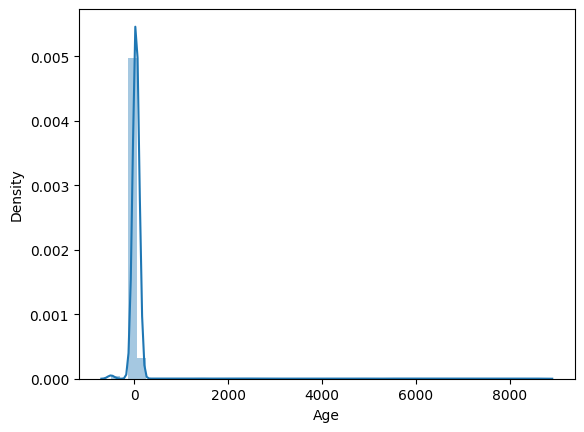

In [1385]:
sns.distplot(data.Age)

In [1386]:
Q1 = data['Age'].quantile(0.25)
Q3 = data['Age'].quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Identify and remove outliers
data = data[(data['Age'] >= lower_bound) & (data['Age'] <= upper_bound)]

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\4003340619.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Age)


<Axes: xlabel='Age', ylabel='Density'>

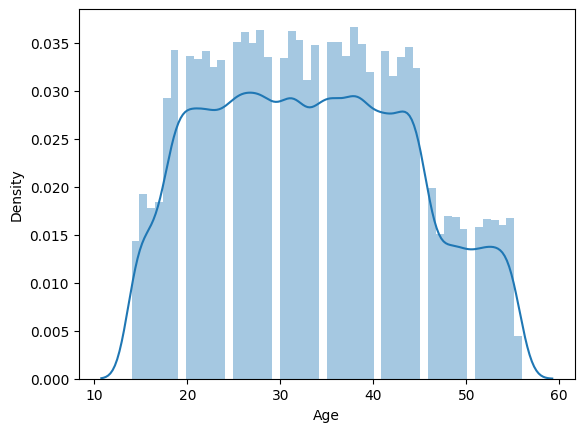

In [1387]:
sns.distplot(data.Age)

In [1388]:
data.corr(numeric_only=True)['Age']

Age                         1.000000
Monthly_Inhand_Salary       0.089056
Num_Bank_Accounts          -0.000335
Num_Credit_Card            -0.005832
Interest_Rate              -0.001350
Delay_from_due_date        -0.173691
Num_Credit_Inquiries       -0.005935
Credit_Utilization_Ratio    0.025082
Total_EMI_per_month         0.001080
Credit_Score                0.159870
Name: Age, dtype: float64

In [1389]:
data.shape

(97219, 24)

## Occupation

In [1390]:
data.Occupation.value_counts()

Occupation
_______          6872
Lawyer           6389
Architect        6175
Engineer         6171
Scientist        6113
Accountant       6110
Mechanic         6099
Media_Manager    6068
Teacher          6049
Developer        6031
Entrepreneur     6014
Doctor           5915
Journalist       5906
Manager          5806
Musician         5760
Writer           5741
Name: count, dtype: int64

In [1391]:
data.Occupation = data.Occupation.str.replace('_______','other')

## Annual_Income

In [1392]:
data.Annual_Income.value_counts()

Annual_Income
20867.67     16
36585.12     16
95596.35     15
17273.83     15
33029.66     15
             ..
54734.0_      1
37840.64_     1
42843.65_     1
44134.06_     1
70778.4_      1
Name: count, Length: 18812, dtype: int64

In [1393]:
data['Annual_Income'] = data['Annual_Income'].str.replace('_','').astype(float)

In [1394]:
data.Annual_Income.isnull().sum()

0

In [1395]:
data.corr(numeric_only=True)['Annual_Income'] ## Not much related

Age                         0.006486
Annual_Income               1.000000
Monthly_Inhand_Salary       0.030322
Num_Bank_Accounts          -0.004557
Num_Credit_Card             0.001607
Interest_Rate              -0.003388
Delay_from_due_date        -0.010952
Num_Credit_Inquiries        0.000948
Credit_Utilization_Ratio    0.010165
Total_EMI_per_month        -0.001896
Credit_Score                0.007763
Name: Annual_Income, dtype: float64

In [1396]:
data.Annual_Income.min(),data.Annual_Income.max()

(7005.93, 24198062.0)

In [1397]:
data.Annual_Income.mean()

176848.34916780674

In [1398]:
data.shape

(97219, 24)

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\2446505535.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.log1p(data.Annual_Income))


<Axes: xlabel='Annual_Income', ylabel='Density'>

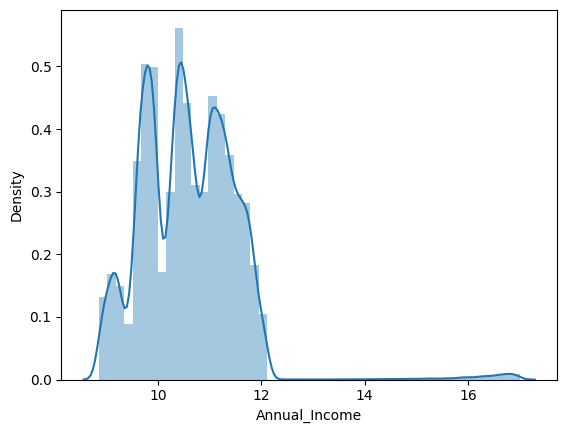

In [1399]:
sns.distplot(np.log1p(data.Annual_Income))

## Monthly_Inhand_Salary

In [1400]:
data.Monthly_Inhand_Salary.info()

<class 'pandas.core.series.Series'>
Index: 97219 entries, 0 to 99999
Series name: Monthly_Inhand_Salary
Non-Null Count  Dtype  
--------------  -----  
82623 non-null  float64
dtypes: float64(1)
memory usage: 1.5 MB


In [1401]:
data.Monthly_Inhand_Salary.value_counts()

Monthly_Inhand_Salary
6082.187500    15
6769.130000    15
2295.058333    15
3080.555000    14
6358.956667    14
               ..
2603.775566     1
1879.396612     1
3433.242498     1
4227.536020     1
1087.546445     1
Name: count, Length: 13226, dtype: int64

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\3273024379.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Monthly_Inhand_Salary)


<Axes: xlabel='Monthly_Inhand_Salary', ylabel='Density'>

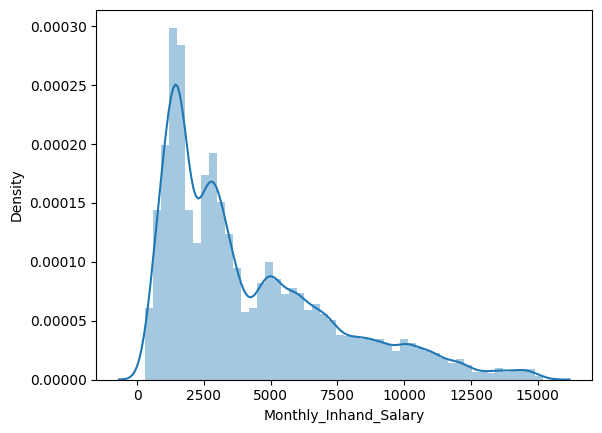

In [1402]:
sns.distplot(data.Monthly_Inhand_Salary)

In [1403]:
## Fill NAN Values

In [1404]:
monthly_data = data.copy()
monthly_data.shape

(97219, 24)

In [1405]:
data = monthly_data.copy()

In [1406]:
data.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,January,23,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,2.0
1,February,23,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,2.0
3,April,23,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,2.0
4,May,23,Scientist,19114.12,1824.843333,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,2.0
5,June,23,Scientist,19114.12,NaN,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,27.262259,22 Years and 6 Months,No,49.574949,62.430172331195294,!@9#%8,340.4792117872438,2.0


In [1407]:
data['Monthly_Inhand_Salary'] = np.log1p(data.Monthly_Inhand_Salary)

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\3273024379.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Monthly_Inhand_Salary)


<Axes: xlabel='Monthly_Inhand_Salary', ylabel='Density'>

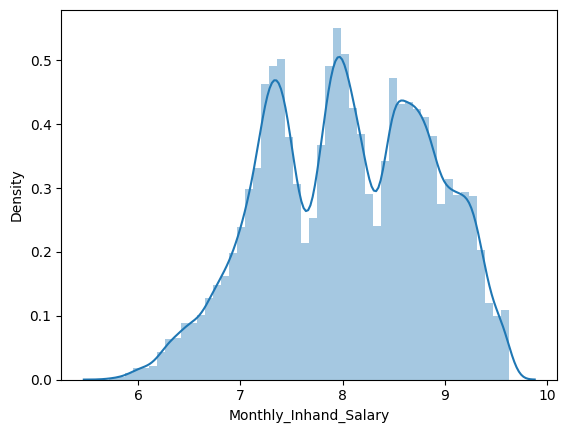

In [1408]:
sns.distplot(data.Monthly_Inhand_Salary)

In [1409]:
data.Monthly_Inhand_Salary.isnull().sum()

14596

In [1410]:
random_monthly_salary_values = np.random.uniform(data.Monthly_Inhand_Salary.mean()-data.Monthly_Inhand_Salary.std()*1.5,data.Monthly_Inhand_Salary.mean()+data.Monthly_Inhand_Salary.std()*1.5,14596)

In [1411]:
random_monthly_salary_values[:20]

array([7.06479597, 9.01133473, 8.88513441, 9.23118292, 8.61480971,
       7.84153081, 7.94184331, 7.44039557, 8.46607769, 8.75581178,
       8.6023831 , 7.56100908, 7.26554793, 7.39746887, 7.65873525,
       7.48525275, 7.86496474, 8.01737646, 8.66348979, 8.78820532])

In [1412]:
#data.Monthly_Inhand_Salary.mean()-data.Monthly_Inhand_Salary.std()*1.5,data.Monthly_Inhand_Salary.mean()+data.Monthly_Inhand_Salary.std()*1.5

In [1413]:
data['Monthly_Inhand_Salary'][data.Monthly_Inhand_Salary.isnull()]= random_monthly_salary_values

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\1569770598.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Monthly_Inhand_Salary'][data.Monthly_Inhand_Salary.isnull()]= random_monthly_salary_values


C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\3273024379.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Monthly_Inhand_Salary)


<Axes: xlabel='Monthly_Inhand_Salary', ylabel='Density'>

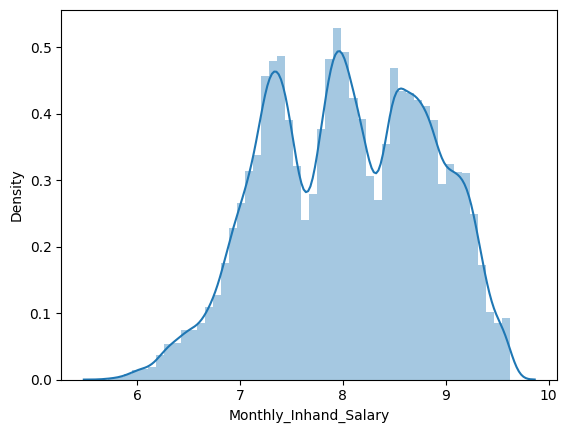

In [1414]:
sns.distplot(data.Monthly_Inhand_Salary)

In [1415]:
data.isnull().sum()

Month                           0
Age                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11074
Delay_from_due_date             0
Num_of_Delayed_Payment       6824
Changed_Credit_Limit            0
Num_Credit_Inquiries         1906
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           8791
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4344
Payment_Behaviour               0
Monthly_Balance              1179
Credit_Score                    0
dtype: int64

In [1416]:
data.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,January,23,Scientist,19114.12,7.509797,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,2.0
1,February,23,Scientist,19114.12,7.064796,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,2.0
3,April,23,Scientist,19114.12,9.011335,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,2.0
4,May,23,Scientist,19114.12,7.509797,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,2.0
5,June,23,Scientist,19114.12,8.885134,3,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,27.262259,22 Years and 6 Months,No,49.574949,62.430172331195294,!@9#%8,340.4792117872438,2.0


In [1417]:
data.corr(numeric_only=True)['Monthly_Inhand_Salary']

Age                         0.078280
Annual_Income               0.024553
Monthly_Inhand_Salary       1.000000
Num_Bank_Accounts          -0.009841
Num_Credit_Card            -0.002568
Interest_Rate              -0.004365
Delay_from_due_date        -0.215824
Num_Credit_Inquiries       -0.007895
Credit_Utilization_Ratio    0.128713
Total_EMI_per_month         0.004563
Credit_Score                0.182849
Name: Monthly_Inhand_Salary, dtype: float64

## Num_Bank_Accounts              

In [1418]:
Num_Bank = data.copy()

In [1419]:
#data = Num_Bank.copy()

In [1420]:
data.Num_Bank_Accounts.value_counts()

Num_Bank_Accounts
6       12629
7       12473
8       12437
4       11837
5       11796
        ...  
1470        1
211         1
1221        1
753         1
697         1
Name: count, Length: 925, dtype: int64

In [1421]:
#data.Num_Bank_Accounts.unique()

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\2634827339.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Num_Bank_Accounts)


<Axes: xlabel='Num_Bank_Accounts', ylabel='Density'>

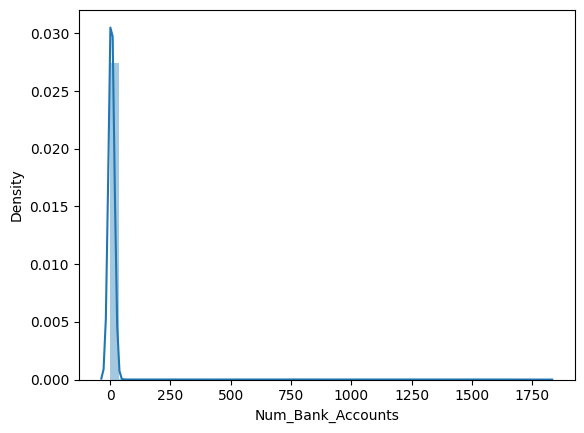

In [1422]:
sns.distplot(data.Num_Bank_Accounts)

In [1423]:
data = data[(data.Num_Bank_Accounts >= 0) &(data.Num_Bank_Accounts <= 11)]

In [1424]:
data['Num_Bank_Accounts'] = data['Num_Bank_Accounts'].replace(0,np.nan)

In [1425]:
data.Num_Bank_Accounts.isnull().sum()

4195

In [1426]:
data.shape

(95916, 24)

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\2634827339.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Num_Bank_Accounts)


<Axes: xlabel='Num_Bank_Accounts', ylabel='Density'>

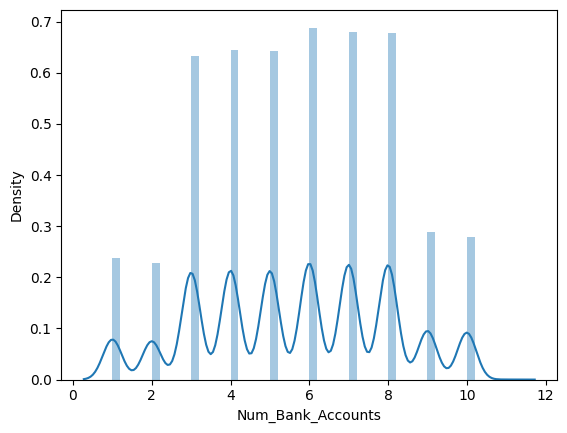

In [1427]:
sns.distplot(data.Num_Bank_Accounts)

In [1428]:
data.Num_Bank_Accounts.value_counts(dropna=False)

Num_Bank_Accounts
6.0     12629
7.0     12473
8.0     12437
4.0     11837
5.0     11796
3.0     11625
9.0      5285
10.0     5104
1.0      4358
NaN      4195
2.0      4169
11.0        8
Name: count, dtype: int64

In [1429]:
## Filling Missing Values

In [1430]:
random_num_bank_accounts = np.random.randint(data.Num_Bank_Accounts.mean()-data.Num_Bank_Accounts.std()*2,data.Num_Bank_Accounts.mean()+data.Num_Bank_Accounts.std()*2,4195)

In [1431]:
random_num_bank_accounts[:10]

array([2, 6, 6, 0, 8, 1, 0, 7, 6, 1])

In [1432]:
data['Num_Bank_Accounts'][data.Num_Bank_Accounts.isnull()]= random_num_bank_accounts

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\2994349834.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Num_Bank_Accounts'][data.Num_Bank_Accounts.isnull()]= random_num_bank_accounts


C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\2634827339.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Num_Bank_Accounts)


<Axes: xlabel='Num_Bank_Accounts', ylabel='Density'>

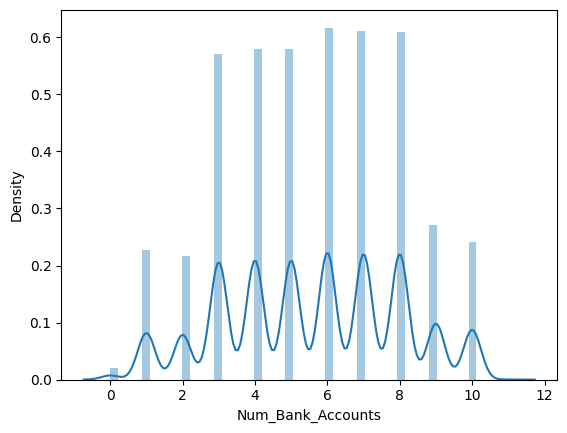

In [1433]:
sns.distplot(data.Num_Bank_Accounts)

In [1434]:
data.isnull().sum()

Month                           0
Age                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                10919
Delay_from_due_date             0
Num_of_Delayed_Payment       6730
Changed_Credit_Limit            0
Num_Credit_Inquiries         1874
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           8677
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4284
Payment_Behaviour               0
Monthly_Balance              1164
Credit_Score                    0
dtype: int64

In [1435]:
data.shape

(95916, 24)

## Num_Credit_Card 

In [1436]:
num_credit_card = data.copy()

In [1437]:
data.Num_Credit_Card.value_counts()

Num_Credit_Card
5       17700
7       15934
6       15883
4       13471
3       12742
        ...  
65          1
1140        1
515         1
290         1
679         1
Name: count, Length: 1161, dtype: int64

In [1438]:
data.Num_Credit_Card.isnull().sum()

0

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\4096428445.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Num_Credit_Card)


<Axes: xlabel='Num_Credit_Card', ylabel='Density'>

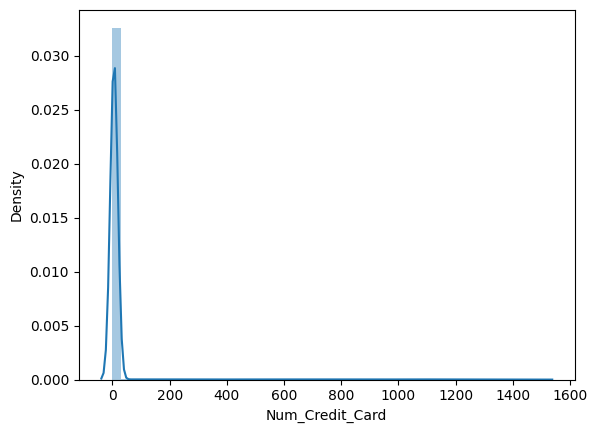

In [1439]:
sns.distplot(data.Num_Credit_Card)

In [1440]:
data[data.Num_Credit_Card < 0]

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score


In [1441]:
Q1 = data['Num_Credit_Card'].quantile(0.25)
Q3 = data['Num_Credit_Card'].quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print(lower_bound,upper_bound)
# Identify and remove outliers
data = data[(data['Num_Credit_Card'] >= lower_bound) & (data['Num_Credit_Card'] <= upper_bound)]

-0.5 11.5


In [1442]:
data.shape

(93732, 24)

In [1443]:
data.isnull().sum()

Month                           0
Age                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                10635
Delay_from_due_date             0
Num_of_Delayed_Payment       6576
Changed_Credit_Limit            0
Num_Credit_Inquiries         1826
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           8516
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4182
Payment_Behaviour               0
Monthly_Balance              1139
Credit_Score                    0
dtype: int64

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\4096428445.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Num_Credit_Card)


<Axes: xlabel='Num_Credit_Card', ylabel='Density'>

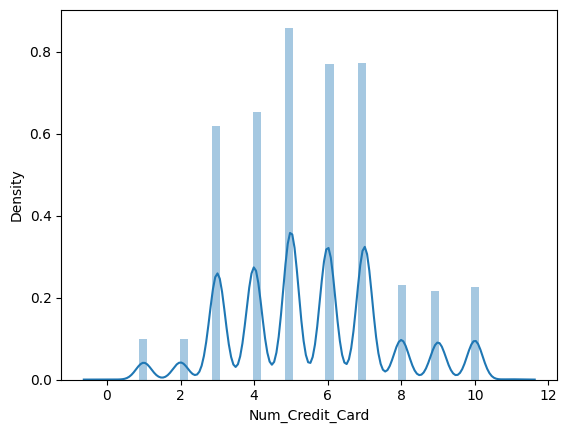

In [1444]:
sns.distplot(data.Num_Credit_Card)

## Interest_Rate

In [1445]:
interest_rate = data.copy()

In [1522]:
data = interest_rate.copy()

In [1523]:
data.Interest_Rate.value_counts()

Interest_Rate
8       4690
5       4656
6       4447
10      4255
12      4251
        ... 
5762       1
4372       1
4905       1
1683       1
5729       1
Name: count, Length: 1663, dtype: int64

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\1266825535.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Interest_Rate)


<Axes: xlabel='Interest_Rate', ylabel='Density'>

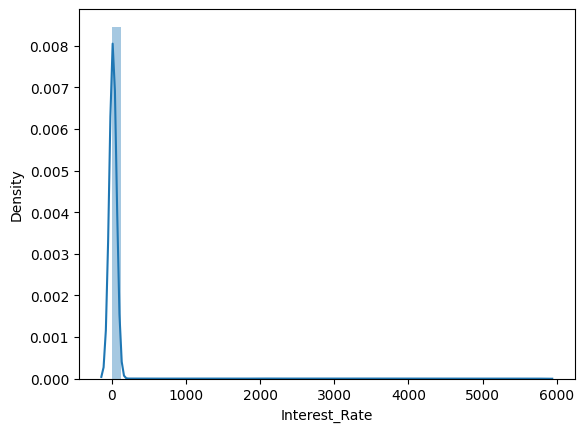

In [1524]:
sns.distplot(data.Interest_Rate)

In [1525]:
data[data.Interest_Rate > 100]

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
44,May,31,Lawyer,73928.46,8.697797,4.0,5,5318,0,NaN,...,_,548.2,26.333310,32 Years and 3 Months,No,0.000000,177.95183568608738,Low_spent_Large_value_payments,690.9186643139128,2.0
89,February,33,Engineer,88640.24,8.891193,3.0,6,433,2,"Payday Loan, and Payday Loan",...,Good,950.36,41.036168,25 Years and 6 Months,NM,135.173371,157.174788304235,High_spent_Large_value_payments,674.3205073907143,2.0
167,August,41,Musician,19514.88,8.931495,7.0,5,5240,0,NaN,...,_,881.4,28.781888,19 Years and 10 Months,No,0.000000,99.1415414879628,High_spent_Small_value_payments,343.6824585120372,0.0
178,March,20,Entrepreneur,106733.13,9.090929,4.0,4,4975,0,NaN,...,Good,76.23,42.070459,32 Years and 11 Months,No,0.000000,172.03282853259896,High_spent_Large_value_payments,955.3099214674013,2.0
229,June,40,Architect,28572.39,7.528360,6.0,3,668,3,"Payday Loan, Not Specified, and Auto Loan",...,Standard,400.07,35.693949,30 Years and 8 Months,Yes,69.602920,129.264834657262,Low_spent_Small_value_payments,312.13549486074794,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99791,August,54,Musician,99520.50,9.045510,3.0,1,4396,3,"Home Equity Loan, Not Specified, and Debt Cons...",...,Good,547.21,38.798114,16 Years and 8 Months,NM,196.528591,147.56351637381565,!@9#%8,743.845393,2.0
99801,February,16,Developer,14937.49,7.042103,8.0,8,387,-100,"Student Loan, Mortgage Loan, Debt Consolidatio...",...,Bad,3699.44,35.964828,13 Years and 3 Months,Yes,50.960878,149.8878636710056,Low_spent_Small_value_payments,203.430341,1.0
99882,March,31,Mechanic,16884797.00,8.601892,7.0,3,1947,0,NaN,...,Standard,330.6,38.524095,23 Years and 0 Months,Yes,0.000000,__10000__,High_spent_Small_value_payments,536.34292,1.0
99914,March,54,Media_Manager,20059.98,7.329530,8.0,5,360,4,"Home Equity Loan, Payday Loan, Not Specified, ...",...,Good,909.01,29.204711,16 Years and 5 Months,No,45.076827,111.56713873012444,Low_spent_Large_value_payments,265.722534,0.0


In [1526]:
Q1 = data['Interest_Rate'].quantile(0.25)
Q3 = data['Interest_Rate'].quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print(lower_bound,upper_bound)
# Identify and remove outliers
data = data[(data['Interest_Rate'] >= lower_bound) & (data['Interest_Rate'] <= upper_bound)]

-10.0 38.0


In [1527]:
#data.Interest_Rate.value_counts()

In [1528]:
data.isnull().sum()

Month                           0
Age                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary           0
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                10433
Delay_from_due_date             0
Num_of_Delayed_Payment       6459
Changed_Credit_Limit            0
Num_Credit_Inquiries         1785
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           8348
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4103
Payment_Behaviour               0
Monthly_Balance              1117
Credit_Score                    0
dtype: int64

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\1266825535.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Interest_Rate)


<Axes: xlabel='Interest_Rate', ylabel='Density'>

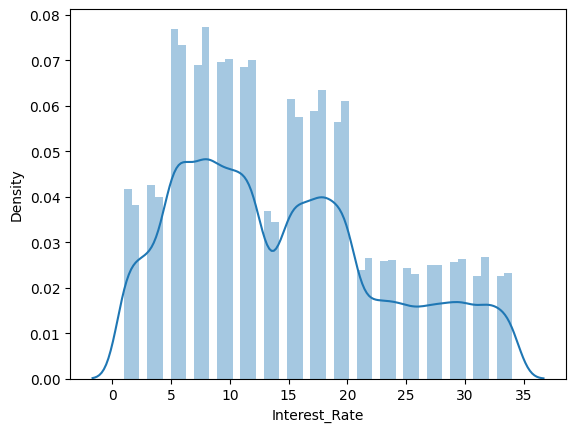

In [1529]:
sns.distplot(data.Interest_Rate)

## Type of Loan

In [1530]:
data.Type_of_Loan.isnull().sum()

10433

In [1531]:
data.Type_of_Loan.unique()

array(['Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan',
       'Credit-Builder Loan', 'Auto Loan, Auto Loan, and Not Specified',
       ..., 'Home Equity Loan, Auto Loan, Auto Loan, and Auto Loan',
       'Payday Loan, Student Loan, Mortgage Loan, and Not Specified',
       'Personal Loan, Auto Loan, Mortgage Loan, Student Loan, and Student Loan'],
      dtype=object)

In [1532]:
data.Type_of_Loan.values

array(['Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan',
       'Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan',
       'Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan',
       ..., 'Auto Loan, and Student Loan', 'Auto Loan, and Student Loan',
       'Auto Loan, and Student Loan'], dtype=object)

In [1533]:
data.Type_of_Loan.fillna(method='ffill',inplace=True)
data.Type_of_Loan.fillna(method='bfill',inplace=True)

In [1534]:
data.Type_of_Loan =data.Type_of_Loan.str.replace(', and',',')

In [1535]:
data.head(2)

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,January,23,Scientist,19114.12,7.509797,3.0,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,_,809.98,26.82262,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,2.0
1,February,23,Scientist,19114.12,7.064796,3.0,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,Good,809.98,31.94496,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,2.0


In [1536]:
#makeFrame(data)

In [1573]:
def fun(x):
    data = x.to_frame()
    options = []
    
    #print(data)
    
    for idx,value in x.items():
        print(idx,value)
        for i in value.split(','):
            i = i.strip()
            print(i)
            
            if i not in data.columns:
                print(i)
                options.append(i)
                data[i] = 0
                print(data[i])
            
            data.at[idx,i] = 1  
    return data[options]        

In [1575]:
loan_data =  fun(data['Type_of_Loan'])

0 Auto Loan, Credit-Builder Loan, Personal Loan, Home Equity Loan
Auto Loan
Auto Loan
0        0
1        0
3        0
4        0
5        0
        ..
99994    0
99995    0
99996    0
99998    0
99999    0
Name: Auto Loan, Length: 91812, dtype: int64
Credit-Builder Loan
Credit-Builder Loan
0        0
1        0
3        0
4        0
5        0
        ..
99994    0
99995    0
99996    0
99998    0
99999    0
Name: Credit-Builder Loan, Length: 91812, dtype: int64
Personal Loan
Personal Loan
0        0
1        0
3        0
4        0
5        0
        ..
99994    0
99995    0
99996    0
99998    0
99999    0
Name: Personal Loan, Length: 91812, dtype: int64
Home Equity Loan
Home Equity Loan
0        0
1        0
3        0
4        0
5        0
        ..
99994    0
99995    0
99996    0
99998    0
99999    0
Name: Home Equity Loan, Length: 91812, dtype: int64
1 Auto Loan, Credit-Builder Loan, Personal Loan, Home Equity Loan
Auto Loan
Credit-Builder Loan
Personal Loan
Home Equity Loan


Personal Loan
1248 Personal Loan, Payday Loan, Personal Loan
Personal Loan
Payday Loan
Personal Loan
1249 Personal Loan, Payday Loan, Personal Loan
Personal Loan
Payday Loan
Personal Loan
1250 Personal Loan, Payday Loan, Personal Loan
Personal Loan
Payday Loan
Personal Loan
1251 Personal Loan, Payday Loan, Personal Loan
Personal Loan
Payday Loan
Personal Loan
1252 Personal Loan, Payday Loan, Personal Loan
Personal Loan
Payday Loan
Personal Loan
1253 Personal Loan, Payday Loan, Personal Loan
Personal Loan
Payday Loan
Personal Loan
1254 Personal Loan, Payday Loan, Personal Loan
Personal Loan
Payday Loan
Personal Loan
1256 Debt Consolidation Loan, Home Equity Loan
Debt Consolidation Loan
Home Equity Loan
1257 Debt Consolidation Loan, Home Equity Loan
Debt Consolidation Loan
Home Equity Loan
1258 Debt Consolidation Loan, Home Equity Loan
Debt Consolidation Loan
Home Equity Loan
1260 Debt Consolidation Loan, Home Equity Loan
Debt Consolidation Loan
Home Equity Loan
1261 Debt Consolidation L

Not Specified
3193 Auto Loan, Student Loan, Not Specified
Auto Loan
Student Loan
Not Specified
3194 Auto Loan, Student Loan, Not Specified
Auto Loan
Student Loan
Not Specified
3195 Auto Loan, Student Loan, Not Specified
Auto Loan
Student Loan
Not Specified
3196 Auto Loan, Student Loan, Not Specified
Auto Loan
Student Loan
Not Specified
3197 Auto Loan, Student Loan, Not Specified
Auto Loan
Student Loan
Not Specified
3198 Auto Loan, Student Loan, Not Specified
Auto Loan
Student Loan
Not Specified
3199 Auto Loan, Student Loan, Not Specified
Auto Loan
Student Loan
Not Specified
3200 Credit-Builder Loan, Payday Loan
Credit-Builder Loan
Payday Loan
3201 Credit-Builder Loan, Payday Loan
Credit-Builder Loan
Payday Loan
3202 Credit-Builder Loan, Payday Loan
Credit-Builder Loan
Payday Loan
3203 Credit-Builder Loan, Payday Loan
Credit-Builder Loan
Payday Loan
3204 Credit-Builder Loan, Payday Loan
Credit-Builder Loan
Payday Loan
3205 Credit-Builder Loan, Payday Loan
Credit-Builder Loan
Payday Loan

Personal Loan
5163 Auto Loan, Personal Loan, Personal Loan, Credit-Builder Loan, Mortgage Loan, Payday Loan, Personal Loan
Auto Loan
Personal Loan
Personal Loan
Credit-Builder Loan
Mortgage Loan
Payday Loan
Personal Loan
5164 Auto Loan, Personal Loan, Personal Loan, Credit-Builder Loan, Mortgage Loan, Payday Loan, Personal Loan
Auto Loan
Personal Loan
Personal Loan
Credit-Builder Loan
Mortgage Loan
Payday Loan
Personal Loan
5165 Auto Loan, Personal Loan, Personal Loan, Credit-Builder Loan, Mortgage Loan, Payday Loan, Personal Loan
Auto Loan
Personal Loan
Personal Loan
Credit-Builder Loan
Mortgage Loan
Payday Loan
Personal Loan
5166 Auto Loan, Personal Loan, Personal Loan, Credit-Builder Loan, Mortgage Loan, Payday Loan, Personal Loan
Auto Loan
Personal Loan
Personal Loan
Credit-Builder Loan
Mortgage Loan
Payday Loan
Personal Loan
5167 Auto Loan, Personal Loan, Personal Loan, Credit-Builder Loan, Mortgage Loan, Payday Loan, Personal Loan
Auto Loan
Personal Loan
Personal Loan
Credit-Buil

Personal Loan
7329 Credit-Builder Loan, Debt Consolidation Loan, Auto Loan, Not Specified, Payday Loan, Not Specified, Credit-Builder Loan
Credit-Builder Loan
Debt Consolidation Loan
Auto Loan
Not Specified
Payday Loan
Not Specified
Credit-Builder Loan
7330 Credit-Builder Loan, Debt Consolidation Loan, Auto Loan, Not Specified, Payday Loan, Not Specified, Credit-Builder Loan
Credit-Builder Loan
Debt Consolidation Loan
Auto Loan
Not Specified
Payday Loan
Not Specified
Credit-Builder Loan
7332 Credit-Builder Loan, Debt Consolidation Loan, Auto Loan, Not Specified, Payday Loan, Not Specified, Credit-Builder Loan
Credit-Builder Loan
Debt Consolidation Loan
Auto Loan
Not Specified
Payday Loan
Not Specified
Credit-Builder Loan
7333 Credit-Builder Loan, Debt Consolidation Loan, Auto Loan, Not Specified, Payday Loan, Not Specified, Credit-Builder Loan
Credit-Builder Loan
Debt Consolidation Loan
Auto Loan
Not Specified
Payday Loan
Not Specified
Credit-Builder Loan
7334 Credit-Builder Loan, Debt

Student Loan
Not Specified
Mortgage Loan
Auto Loan
Not Specified
9124 Debt Consolidation Loan, Payday Loan, Student Loan, Not Specified, Mortgage Loan, Auto Loan, Not Specified
Debt Consolidation Loan
Payday Loan
Student Loan
Not Specified
Mortgage Loan
Auto Loan
Not Specified
9125 Debt Consolidation Loan, Payday Loan, Student Loan, Not Specified, Mortgage Loan, Auto Loan, Not Specified
Debt Consolidation Loan
Payday Loan
Student Loan
Not Specified
Mortgage Loan
Auto Loan
Not Specified
9126 Debt Consolidation Loan, Payday Loan, Student Loan, Not Specified, Mortgage Loan, Auto Loan, Not Specified
Debt Consolidation Loan
Payday Loan
Student Loan
Not Specified
Mortgage Loan
Auto Loan
Not Specified
9127 Debt Consolidation Loan, Payday Loan, Student Loan, Not Specified, Mortgage Loan, Auto Loan, Not Specified
Debt Consolidation Loan
Payday Loan
Student Loan
Not Specified
Mortgage Loan
Auto Loan
Not Specified
9128 Credit-Builder Loan, Personal Loan, Mortgage Loan, Debt Consolidation Loan, De

Student Loan
Personal Loan
10745 Debt Consolidation Loan, Personal Loan, Student Loan, Personal Loan
Debt Consolidation Loan
Personal Loan
Student Loan
Personal Loan
10746 Debt Consolidation Loan, Personal Loan, Student Loan, Personal Loan
Debt Consolidation Loan
Personal Loan
Student Loan
Personal Loan
10747 Debt Consolidation Loan, Personal Loan, Student Loan, Personal Loan
Debt Consolidation Loan
Personal Loan
Student Loan
Personal Loan
10748 Debt Consolidation Loan, Personal Loan, Student Loan, Personal Loan
Debt Consolidation Loan
Personal Loan
Student Loan
Personal Loan
10749 Debt Consolidation Loan, Personal Loan, Student Loan, Personal Loan
Debt Consolidation Loan
Personal Loan
Student Loan
Personal Loan
10750 Debt Consolidation Loan, Personal Loan, Student Loan, Personal Loan
Debt Consolidation Loan
Personal Loan
Student Loan
Personal Loan
10751 Debt Consolidation Loan, Personal Loan, Student Loan, Personal Loan
Debt Consolidation Loan
Personal Loan
Student Loan
Personal Loan


Student Loan
11970 Payday Loan, Student Loan, Home Equity Loan, Credit-Builder Loan, Not Specified, Student Loan, Credit-Builder Loan, Student Loan
Payday Loan
Student Loan
Home Equity Loan
Credit-Builder Loan
Not Specified
Student Loan
Credit-Builder Loan
Student Loan
11971 Payday Loan, Student Loan, Home Equity Loan, Credit-Builder Loan, Not Specified, Student Loan, Credit-Builder Loan, Student Loan
Payday Loan
Student Loan
Home Equity Loan
Credit-Builder Loan
Not Specified
Student Loan
Credit-Builder Loan
Student Loan
11972 Payday Loan, Student Loan, Home Equity Loan, Credit-Builder Loan, Not Specified, Student Loan, Credit-Builder Loan, Student Loan
Payday Loan
Student Loan
Home Equity Loan
Credit-Builder Loan
Not Specified
Student Loan
Credit-Builder Loan
Student Loan
11973 Payday Loan, Student Loan, Home Equity Loan, Credit-Builder Loan, Not Specified, Student Loan, Credit-Builder Loan, Student Loan
Payday Loan
Student Loan
Home Equity Loan
Credit-Builder Loan
Not Specified
Stude

Auto Loan
Credit-Builder Loan
Payday Loan
13209 Mortgage Loan, Auto Loan, Student Loan, Student Loan, Personal Loan, Credit-Builder Loan, Auto Loan, Credit-Builder Loan, Payday Loan
Mortgage Loan
Auto Loan
Student Loan
Student Loan
Personal Loan
Credit-Builder Loan
Auto Loan
Credit-Builder Loan
Payday Loan
13210 Mortgage Loan, Auto Loan, Student Loan, Student Loan, Personal Loan, Credit-Builder Loan, Auto Loan, Credit-Builder Loan, Payday Loan
Mortgage Loan
Auto Loan
Student Loan
Student Loan
Personal Loan
Credit-Builder Loan
Auto Loan
Credit-Builder Loan
Payday Loan
13212 Mortgage Loan, Auto Loan, Student Loan, Student Loan, Personal Loan, Credit-Builder Loan, Auto Loan, Credit-Builder Loan, Payday Loan
Mortgage Loan
Auto Loan
Student Loan
Student Loan
Personal Loan
Credit-Builder Loan
Auto Loan
Credit-Builder Loan
Payday Loan
13213 Mortgage Loan, Auto Loan, Student Loan, Student Loan, Personal Loan, Credit-Builder Loan, Auto Loan, Credit-Builder Loan, Payday Loan
Mortgage Loan
Auto L

14040 Mortgage Loan, Not Specified, Payday Loan, Debt Consolidation Loan, Mortgage Loan
Mortgage Loan
Not Specified
Payday Loan
Debt Consolidation Loan
Mortgage Loan
14042 Mortgage Loan, Not Specified, Payday Loan, Debt Consolidation Loan, Mortgage Loan
Mortgage Loan
Not Specified
Payday Loan
Debt Consolidation Loan
Mortgage Loan
14043 Mortgage Loan, Not Specified, Payday Loan, Debt Consolidation Loan, Mortgage Loan
Mortgage Loan
Not Specified
Payday Loan
Debt Consolidation Loan
Mortgage Loan
14044 Mortgage Loan, Not Specified, Payday Loan, Debt Consolidation Loan, Mortgage Loan
Mortgage Loan
Not Specified
Payday Loan
Debt Consolidation Loan
Mortgage Loan
14045 Mortgage Loan, Not Specified, Payday Loan, Debt Consolidation Loan, Mortgage Loan
Mortgage Loan
Not Specified
Payday Loan
Debt Consolidation Loan
Mortgage Loan
14046 Mortgage Loan, Not Specified, Payday Loan, Debt Consolidation Loan, Mortgage Loan
Mortgage Loan
Not Specified
Payday Loan
Debt Consolidation Loan
Mortgage Loan
1404

Home Equity Loan
Payday Loan
15040 Credit-Builder Loan, Mortgage Loan, Debt Consolidation Loan, Student Loan
Credit-Builder Loan
Mortgage Loan
Debt Consolidation Loan
Student Loan
15041 Credit-Builder Loan, Mortgage Loan, Debt Consolidation Loan, Student Loan
Credit-Builder Loan
Mortgage Loan
Debt Consolidation Loan
Student Loan
15042 Credit-Builder Loan, Mortgage Loan, Debt Consolidation Loan, Student Loan
Credit-Builder Loan
Mortgage Loan
Debt Consolidation Loan
Student Loan
15044 Credit-Builder Loan, Mortgage Loan, Debt Consolidation Loan, Student Loan
Credit-Builder Loan
Mortgage Loan
Debt Consolidation Loan
Student Loan
15045 Credit-Builder Loan, Mortgage Loan, Debt Consolidation Loan, Student Loan
Credit-Builder Loan
Mortgage Loan
Debt Consolidation Loan
Student Loan
15047 Credit-Builder Loan, Mortgage Loan, Debt Consolidation Loan, Student Loan
Credit-Builder Loan
Mortgage Loan
Debt Consolidation Loan
Student Loan
15048 Auto Loan, Payday Loan, Personal Loan, Not Specified, Payda

15900 Mortgage Loan, Personal Loan
Mortgage Loan
Personal Loan
15901 Mortgage Loan, Personal Loan
Mortgage Loan
Personal Loan
15902 Mortgage Loan, Personal Loan
Mortgage Loan
Personal Loan
15903 Mortgage Loan, Personal Loan
Mortgage Loan
Personal Loan
15904 Not Specified, Auto Loan, Student Loan, Personal Loan, Credit-Builder Loan, Auto Loan, Home Equity Loan, Credit-Builder Loan, Auto Loan
Not Specified
Auto Loan
Student Loan
Personal Loan
Credit-Builder Loan
Auto Loan
Home Equity Loan
Credit-Builder Loan
Auto Loan
15905 Not Specified, Auto Loan, Student Loan, Personal Loan, Credit-Builder Loan, Auto Loan, Home Equity Loan, Credit-Builder Loan, Auto Loan
Not Specified
Auto Loan
Student Loan
Personal Loan
Credit-Builder Loan
Auto Loan
Home Equity Loan
Credit-Builder Loan
Auto Loan
15906 Not Specified, Auto Loan, Student Loan, Personal Loan, Credit-Builder Loan, Auto Loan, Home Equity Loan, Credit-Builder Loan, Auto Loan
Not Specified
Auto Loan
Student Loan
Personal Loan
Credit-Builder 

Payday Loan
Not Specified
17146 Not Specified, Credit-Builder Loan, Debt Consolidation Loan, Home Equity Loan, Payday Loan, Not Specified
Not Specified
Credit-Builder Loan
Debt Consolidation Loan
Home Equity Loan
Payday Loan
Not Specified
17147 Not Specified, Credit-Builder Loan, Debt Consolidation Loan, Home Equity Loan, Payday Loan, Not Specified
Not Specified
Credit-Builder Loan
Debt Consolidation Loan
Home Equity Loan
Payday Loan
Not Specified
17148 Not Specified, Credit-Builder Loan, Debt Consolidation Loan, Home Equity Loan, Payday Loan, Not Specified
Not Specified
Credit-Builder Loan
Debt Consolidation Loan
Home Equity Loan
Payday Loan
Not Specified
17149 Not Specified, Credit-Builder Loan, Debt Consolidation Loan, Home Equity Loan, Payday Loan, Not Specified
Not Specified
Credit-Builder Loan
Debt Consolidation Loan
Home Equity Loan
Payday Loan
Not Specified
17150 Not Specified, Credit-Builder Loan, Debt Consolidation Loan, Home Equity Loan, Payday Loan, Not Specified
Not Specif

Mortgage Loan
Not Specified
Payday Loan
18340 Payday Loan, Debt Consolidation Loan, Debt Consolidation Loan, Debt Consolidation Loan, Mortgage Loan, Not Specified, Payday Loan
Payday Loan
Debt Consolidation Loan
Debt Consolidation Loan
Debt Consolidation Loan
Mortgage Loan
Not Specified
Payday Loan
18341 Payday Loan, Debt Consolidation Loan, Debt Consolidation Loan, Debt Consolidation Loan, Mortgage Loan, Not Specified, Payday Loan
Payday Loan
Debt Consolidation Loan
Debt Consolidation Loan
Debt Consolidation Loan
Mortgage Loan
Not Specified
Payday Loan
18342 Payday Loan, Debt Consolidation Loan, Debt Consolidation Loan, Debt Consolidation Loan, Mortgage Loan, Not Specified, Payday Loan
Payday Loan
Debt Consolidation Loan
Debt Consolidation Loan
Debt Consolidation Loan
Mortgage Loan
Not Specified
Payday Loan
18344 Not Specified, Auto Loan, Mortgage Loan, Payday Loan, Home Equity Loan
Not Specified
Auto Loan
Mortgage Loan
Payday Loan
Home Equity Loan
18345 Not Specified, Auto Loan, Mort

Mortgage Loan
19774 Payday Loan, Payday Loan, Not Specified, Personal Loan, Auto Loan, Credit-Builder Loan, Mortgage Loan, Mortgage Loan
Payday Loan
Payday Loan
Not Specified
Personal Loan
Auto Loan
Credit-Builder Loan
Mortgage Loan
Mortgage Loan
19775 Payday Loan, Payday Loan, Not Specified, Personal Loan, Auto Loan, Credit-Builder Loan, Mortgage Loan, Mortgage Loan
Payday Loan
Payday Loan
Not Specified
Personal Loan
Auto Loan
Credit-Builder Loan
Mortgage Loan
Mortgage Loan
19776 Auto Loan, Mortgage Loan, Personal Loan, Debt Consolidation Loan
Auto Loan
Mortgage Loan
Personal Loan
Debt Consolidation Loan
19777 Auto Loan, Mortgage Loan, Personal Loan, Debt Consolidation Loan
Auto Loan
Mortgage Loan
Personal Loan
Debt Consolidation Loan
19778 Auto Loan, Mortgage Loan, Personal Loan, Debt Consolidation Loan
Auto Loan
Mortgage Loan
Personal Loan
Debt Consolidation Loan
19780 Auto Loan, Mortgage Loan, Personal Loan, Debt Consolidation Loan
Auto Loan
Mortgage Loan
Personal Loan
Debt Consoli

Student Loan
21397 Payday Loan, Mortgage Loan, Personal Loan, Student Loan
Payday Loan
Mortgage Loan
Personal Loan
Student Loan
21398 Payday Loan, Mortgage Loan, Personal Loan, Student Loan
Payday Loan
Mortgage Loan
Personal Loan
Student Loan
21400 Auto Loan, Payday Loan, Auto Loan
Auto Loan
Payday Loan
Auto Loan
21401 Auto Loan, Payday Loan, Auto Loan
Auto Loan
Payday Loan
Auto Loan
21402 Auto Loan, Payday Loan, Auto Loan
Auto Loan
Payday Loan
Auto Loan
21403 Auto Loan, Payday Loan, Auto Loan
Auto Loan
Payday Loan
Auto Loan
21404 Auto Loan, Payday Loan, Auto Loan
Auto Loan
Payday Loan
Auto Loan
21405 Auto Loan, Payday Loan, Auto Loan
Auto Loan
Payday Loan
Auto Loan
21406 Auto Loan, Payday Loan, Auto Loan
Auto Loan
Payday Loan
Auto Loan
21407 Auto Loan, Payday Loan, Auto Loan
Auto Loan
Payday Loan
Auto Loan
21408 Student Loan, Mortgage Loan, Personal Loan, Payday Loan
Student Loan
Mortgage Loan
Personal Loan
Payday Loan
21409 Student Loan, Mortgage Loan, Personal Loan, Payday Loan
Stud

Not Specified
Mortgage Loan
Payday Loan
Payday Loan
22438 Debt Consolidation Loan, Not Specified, Mortgage Loan, Payday Loan, Payday Loan
Debt Consolidation Loan
Not Specified
Mortgage Loan
Payday Loan
Payday Loan
22439 Debt Consolidation Loan, Not Specified, Mortgage Loan, Payday Loan, Payday Loan
Debt Consolidation Loan
Not Specified
Mortgage Loan
Payday Loan
Payday Loan
22440 Payday Loan, Debt Consolidation Loan, Mortgage Loan
Payday Loan
Debt Consolidation Loan
Mortgage Loan
22441 Payday Loan, Debt Consolidation Loan, Mortgage Loan
Payday Loan
Debt Consolidation Loan
Mortgage Loan
22442 Payday Loan, Debt Consolidation Loan, Mortgage Loan
Payday Loan
Debt Consolidation Loan
Mortgage Loan
22443 Payday Loan, Debt Consolidation Loan, Mortgage Loan
Payday Loan
Debt Consolidation Loan
Mortgage Loan
22444 Payday Loan, Debt Consolidation Loan, Mortgage Loan
Payday Loan
Debt Consolidation Loan
Mortgage Loan
22445 Payday Loan, Debt Consolidation Loan, Mortgage Loan
Payday Loan
Debt Consolida

24026 Mortgage Loan, Student Loan, Student Loan
Mortgage Loan
Student Loan
Student Loan
24027 Mortgage Loan, Student Loan, Student Loan
Mortgage Loan
Student Loan
Student Loan
24028 Mortgage Loan, Student Loan, Student Loan
Mortgage Loan
Student Loan
Student Loan
24029 Mortgage Loan, Student Loan, Student Loan
Mortgage Loan
Student Loan
Student Loan
24030 Mortgage Loan, Student Loan, Student Loan
Mortgage Loan
Student Loan
Student Loan
24031 Mortgage Loan, Student Loan, Student Loan
Mortgage Loan
Student Loan
Student Loan
24032 Mortgage Loan, Not Specified, Debt Consolidation Loan
Mortgage Loan
Not Specified
Debt Consolidation Loan
24033 Mortgage Loan, Not Specified, Debt Consolidation Loan
Mortgage Loan
Not Specified
Debt Consolidation Loan
24034 Mortgage Loan, Not Specified, Debt Consolidation Loan
Mortgage Loan
Not Specified
Debt Consolidation Loan
24035 Mortgage Loan, Not Specified, Debt Consolidation Loan
Mortgage Loan
Not Specified
Debt Consolidation Loan
24036 Mortgage Loan, Not

Debt Consolidation Loan
Debt Consolidation Loan
25757 Not Specified, Debt Consolidation Loan, Student Loan, Personal Loan, Debt Consolidation Loan, Debt Consolidation Loan
Not Specified
Debt Consolidation Loan
Student Loan
Personal Loan
Debt Consolidation Loan
Debt Consolidation Loan
25758 Not Specified, Debt Consolidation Loan, Student Loan, Personal Loan, Debt Consolidation Loan, Debt Consolidation Loan
Not Specified
Debt Consolidation Loan
Student Loan
Personal Loan
Debt Consolidation Loan
Debt Consolidation Loan
25759 Not Specified, Debt Consolidation Loan, Student Loan, Personal Loan, Debt Consolidation Loan, Debt Consolidation Loan
Not Specified
Debt Consolidation Loan
Student Loan
Personal Loan
Debt Consolidation Loan
Debt Consolidation Loan
25760 Personal Loan, Personal Loan, Payday Loan
Personal Loan
Personal Loan
Payday Loan
25761 Personal Loan, Personal Loan, Payday Loan
Personal Loan
Personal Loan
Payday Loan
25762 Personal Loan, Personal Loan, Payday Loan
Personal Loan
Per

Home Equity Loan
Personal Loan
Personal Loan
Debt Consolidation Loan
26834 Home Equity Loan, Debt Consolidation Loan, Not Specified, Payday Loan, Home Equity Loan, Personal Loan, Personal Loan, Debt Consolidation Loan
Home Equity Loan
Debt Consolidation Loan
Not Specified
Payday Loan
Home Equity Loan
Personal Loan
Personal Loan
Debt Consolidation Loan
26835 Home Equity Loan, Debt Consolidation Loan, Not Specified, Payday Loan, Home Equity Loan, Personal Loan, Personal Loan, Debt Consolidation Loan
Home Equity Loan
Debt Consolidation Loan
Not Specified
Payday Loan
Home Equity Loan
Personal Loan
Personal Loan
Debt Consolidation Loan
26836 Home Equity Loan, Debt Consolidation Loan, Not Specified, Payday Loan, Home Equity Loan, Personal Loan, Personal Loan, Debt Consolidation Loan
Home Equity Loan
Debt Consolidation Loan
Not Specified
Payday Loan
Home Equity Loan
Personal Loan
Personal Loan
Debt Consolidation Loan
26837 Home Equity Loan, Debt Consolidation Loan, Not Specified, Payday Loan,

Personal Loan
Home Equity Loan
28433 Mortgage Loan, Credit-Builder Loan, Personal Loan, Home Equity Loan
Mortgage Loan
Credit-Builder Loan
Personal Loan
Home Equity Loan
28434 Mortgage Loan, Credit-Builder Loan, Personal Loan, Home Equity Loan
Mortgage Loan
Credit-Builder Loan
Personal Loan
Home Equity Loan
28435 Mortgage Loan, Credit-Builder Loan, Personal Loan, Home Equity Loan
Mortgage Loan
Credit-Builder Loan
Personal Loan
Home Equity Loan
28436 Mortgage Loan, Credit-Builder Loan, Personal Loan, Home Equity Loan
Mortgage Loan
Credit-Builder Loan
Personal Loan
Home Equity Loan
28437 Mortgage Loan, Credit-Builder Loan, Personal Loan, Home Equity Loan
Mortgage Loan
Credit-Builder Loan
Personal Loan
Home Equity Loan
28438 Mortgage Loan, Credit-Builder Loan, Personal Loan, Home Equity Loan
Mortgage Loan
Credit-Builder Loan
Personal Loan
Home Equity Loan
28439 Mortgage Loan, Credit-Builder Loan, Personal Loan, Home Equity Loan
Mortgage Loan
Credit-Builder Loan
Personal Loan
Home Equity L

Mortgage Loan
Credit-Builder Loan
29835 Student Loan, Home Equity Loan, Debt Consolidation Loan, Not Specified, Home Equity Loan, Home Equity Loan, Mortgage Loan, Credit-Builder Loan
Student Loan
Home Equity Loan
Debt Consolidation Loan
Not Specified
Home Equity Loan
Home Equity Loan
Mortgage Loan
Credit-Builder Loan
29836 Student Loan, Home Equity Loan, Debt Consolidation Loan, Not Specified, Home Equity Loan, Home Equity Loan, Mortgage Loan, Credit-Builder Loan
Student Loan
Home Equity Loan
Debt Consolidation Loan
Not Specified
Home Equity Loan
Home Equity Loan
Mortgage Loan
Credit-Builder Loan
29837 Student Loan, Home Equity Loan, Debt Consolidation Loan, Not Specified, Home Equity Loan, Home Equity Loan, Mortgage Loan, Credit-Builder Loan
Student Loan
Home Equity Loan
Debt Consolidation Loan
Not Specified
Home Equity Loan
Home Equity Loan
Mortgage Loan
Credit-Builder Loan
29838 Student Loan, Home Equity Loan, Debt Consolidation Loan, Not Specified, Home Equity Loan, Home Equity Loa

Not Specified
Mortgage Loan
31496 Auto Loan, Payday Loan, Not Specified
Auto Loan
Payday Loan
Not Specified
31497 Auto Loan, Payday Loan, Not Specified
Auto Loan
Payday Loan
Not Specified
31498 Auto Loan, Payday Loan, Not Specified
Auto Loan
Payday Loan
Not Specified
31499 Auto Loan, Payday Loan, Not Specified
Auto Loan
Payday Loan
Not Specified
31500 Auto Loan, Payday Loan, Not Specified
Auto Loan
Payday Loan
Not Specified
31501 Auto Loan, Payday Loan, Not Specified
Auto Loan
Payday Loan
Not Specified
31502 Auto Loan, Payday Loan, Not Specified
Auto Loan
Payday Loan
Not Specified
31503 Auto Loan, Payday Loan, Not Specified
Auto Loan
Payday Loan
Not Specified
31504 Payday Loan, Credit-Builder Loan, Credit-Builder Loan, Auto Loan
Payday Loan
Credit-Builder Loan
Credit-Builder Loan
Auto Loan
31505 Payday Loan, Credit-Builder Loan, Credit-Builder Loan, Auto Loan
Payday Loan
Credit-Builder Loan
Credit-Builder Loan
Auto Loan
31506 Payday Loan, Credit-Builder Loan, Credit-Builder Loan, Auto 

33399 Student Loan, Auto Loan, Personal Loan
Student Loan
Auto Loan
Personal Loan
33400 Home Equity Loan, Mortgage Loan
Home Equity Loan
Mortgage Loan
33401 Home Equity Loan, Mortgage Loan
Home Equity Loan
Mortgage Loan
33402 Home Equity Loan, Mortgage Loan
Home Equity Loan
Mortgage Loan
33403 Home Equity Loan, Mortgage Loan
Home Equity Loan
Mortgage Loan
33404 Home Equity Loan, Mortgage Loan
Home Equity Loan
Mortgage Loan
33405 Home Equity Loan, Mortgage Loan
Home Equity Loan
Mortgage Loan
33406 Home Equity Loan, Mortgage Loan
Home Equity Loan
Mortgage Loan
33407 Home Equity Loan, Mortgage Loan
Home Equity Loan
Mortgage Loan
33408 Debt Consolidation Loan, Debt Consolidation Loan, Not Specified, Auto Loan, Credit-Builder Loan, Payday Loan
Debt Consolidation Loan
Debt Consolidation Loan
Not Specified
Auto Loan
Credit-Builder Loan
Payday Loan
33409 Debt Consolidation Loan, Debt Consolidation Loan, Not Specified, Auto Loan, Credit-Builder Loan, Payday Loan
Debt Consolidation Loan
Debt Con

Student Loan
34549 Not Specified, Personal Loan, Student Loan
Not Specified
Personal Loan
Student Loan
34550 Not Specified, Personal Loan, Student Loan
Not Specified
Personal Loan
Student Loan
34551 Not Specified, Personal Loan, Student Loan
Not Specified
Personal Loan
Student Loan
34553 Not Specified
Not Specified
34554 Not Specified
Not Specified
34555 Not Specified
Not Specified
34556 Not Specified
Not Specified
34557 Not Specified
Not Specified
34558 Not Specified
Not Specified
34559 Not Specified
Not Specified
34560 Personal Loan, Mortgage Loan, Credit-Builder Loan, Payday Loan, Not Specified, Personal Loan, Personal Loan, Personal Loan
Personal Loan
Mortgage Loan
Credit-Builder Loan
Payday Loan
Not Specified
Personal Loan
Personal Loan
Personal Loan
34561 Personal Loan, Mortgage Loan, Credit-Builder Loan, Payday Loan, Not Specified, Personal Loan, Personal Loan, Personal Loan
Personal Loan
Mortgage Loan
Credit-Builder Loan
Payday Loan
Not Specified
Personal Loan
Personal Loan
Per

Personal Loan
35692 Home Equity Loan, Personal Loan
Home Equity Loan
Personal Loan
35693 Home Equity Loan, Personal Loan
Home Equity Loan
Personal Loan
35694 Home Equity Loan, Personal Loan
Home Equity Loan
Personal Loan
35695 Home Equity Loan, Personal Loan
Home Equity Loan
Personal Loan
35696 Auto Loan, Personal Loan, Student Loan, Personal Loan, Mortgage Loan, Auto Loan, Mortgage Loan
Auto Loan
Personal Loan
Student Loan
Personal Loan
Mortgage Loan
Auto Loan
Mortgage Loan
35697 Auto Loan, Personal Loan, Student Loan, Personal Loan, Mortgage Loan, Auto Loan, Mortgage Loan
Auto Loan
Personal Loan
Student Loan
Personal Loan
Mortgage Loan
Auto Loan
Mortgage Loan
35698 Auto Loan, Personal Loan, Student Loan, Personal Loan, Mortgage Loan, Auto Loan, Mortgage Loan
Auto Loan
Personal Loan
Student Loan
Personal Loan
Mortgage Loan
Auto Loan
Mortgage Loan
35699 Auto Loan, Personal Loan, Student Loan, Personal Loan, Mortgage Loan, Auto Loan, Mortgage Loan
Auto Loan
Personal Loan
Student Loan
Pe

Personal Loan
Auto Loan
Personal Loan
36920 Mortgage Loan, Student Loan, Credit-Builder Loan
Mortgage Loan
Student Loan
Credit-Builder Loan
36921 Mortgage Loan, Student Loan, Credit-Builder Loan
Mortgage Loan
Student Loan
Credit-Builder Loan
36922 Mortgage Loan, Student Loan, Credit-Builder Loan
Mortgage Loan
Student Loan
Credit-Builder Loan
36923 Mortgage Loan, Student Loan, Credit-Builder Loan
Mortgage Loan
Student Loan
Credit-Builder Loan
36924 Mortgage Loan, Student Loan, Credit-Builder Loan
Mortgage Loan
Student Loan
Credit-Builder Loan
36925 Mortgage Loan, Student Loan, Credit-Builder Loan
Mortgage Loan
Student Loan
Credit-Builder Loan
36927 Mortgage Loan, Student Loan, Credit-Builder Loan
Mortgage Loan
Student Loan
Credit-Builder Loan
36928 Home Equity Loan, Home Equity Loan, Student Loan, Not Specified
Home Equity Loan
Home Equity Loan
Student Loan
Not Specified
36929 Home Equity Loan, Home Equity Loan, Student Loan, Not Specified
Home Equity Loan
Home Equity Loan
Student Loan


Credit-Builder Loan
38187 Mortgage Loan, Credit-Builder Loan
Mortgage Loan
Credit-Builder Loan
38188 Mortgage Loan, Credit-Builder Loan
Mortgage Loan
Credit-Builder Loan
38189 Mortgage Loan, Credit-Builder Loan
Mortgage Loan
Credit-Builder Loan
38190 Mortgage Loan, Credit-Builder Loan
Mortgage Loan
Credit-Builder Loan
38191 Mortgage Loan, Credit-Builder Loan
Mortgage Loan
Credit-Builder Loan
38192 Not Specified, Mortgage Loan, Auto Loan, Mortgage Loan, Mortgage Loan, Personal Loan, Payday Loan, Home Equity Loan, Student Loan
Not Specified
Mortgage Loan
Auto Loan
Mortgage Loan
Mortgage Loan
Personal Loan
Payday Loan
Home Equity Loan
Student Loan
38193 Not Specified, Mortgage Loan, Auto Loan, Mortgage Loan, Mortgage Loan, Personal Loan, Payday Loan, Home Equity Loan, Student Loan
Not Specified
Mortgage Loan
Auto Loan
Mortgage Loan
Mortgage Loan
Personal Loan
Payday Loan
Home Equity Loan
Student Loan
38194 Not Specified, Mortgage Loan, Auto Loan, Mortgage Loan, Mortgage Loan, Personal Loa

Credit-Builder Loan
Credit-Builder Loan
Not Specified
39274 Not Specified, Credit-Builder Loan, Credit-Builder Loan, Not Specified
Not Specified
Credit-Builder Loan
Credit-Builder Loan
Not Specified
39275 Not Specified, Credit-Builder Loan, Credit-Builder Loan, Not Specified
Not Specified
Credit-Builder Loan
Credit-Builder Loan
Not Specified
39276 Not Specified, Credit-Builder Loan, Credit-Builder Loan, Not Specified
Not Specified
Credit-Builder Loan
Credit-Builder Loan
Not Specified
39277 Not Specified, Credit-Builder Loan, Credit-Builder Loan, Not Specified
Not Specified
Credit-Builder Loan
Credit-Builder Loan
Not Specified
39278 Not Specified, Credit-Builder Loan, Credit-Builder Loan, Not Specified
Not Specified
Credit-Builder Loan
Credit-Builder Loan
Not Specified
39280 Credit-Builder Loan, Debt Consolidation Loan, Home Equity Loan, Credit-Builder Loan
Credit-Builder Loan
Debt Consolidation Loan
Home Equity Loan
Credit-Builder Loan
39281 Credit-Builder Loan, Debt Consolidation Loan

Not Specified
Credit-Builder Loan
41221 Payday Loan, Mortgage Loan, Home Equity Loan, Auto Loan, Student Loan, Not Specified, Credit-Builder Loan
Payday Loan
Mortgage Loan
Home Equity Loan
Auto Loan
Student Loan
Not Specified
Credit-Builder Loan
41222 Payday Loan, Mortgage Loan, Home Equity Loan, Auto Loan, Student Loan, Not Specified, Credit-Builder Loan
Payday Loan
Mortgage Loan
Home Equity Loan
Auto Loan
Student Loan
Not Specified
Credit-Builder Loan
41223 Payday Loan, Mortgage Loan, Home Equity Loan, Auto Loan, Student Loan, Not Specified, Credit-Builder Loan
Payday Loan
Mortgage Loan
Home Equity Loan
Auto Loan
Student Loan
Not Specified
Credit-Builder Loan
41224 Not Specified, Auto Loan, Student Loan
Not Specified
Auto Loan
Student Loan
41225 Not Specified, Auto Loan, Student Loan
Not Specified
Auto Loan
Student Loan
41226 Not Specified, Auto Loan, Student Loan
Not Specified
Auto Loan
Student Loan
41227 Not Specified, Auto Loan, Student Loan
Not Specified
Auto Loan
Student Loan
41

42788 Credit-Builder Loan, Not Specified, Credit-Builder Loan, Home Equity Loan
Credit-Builder Loan
Not Specified
Credit-Builder Loan
Home Equity Loan
42789 Credit-Builder Loan, Not Specified, Credit-Builder Loan, Home Equity Loan
Credit-Builder Loan
Not Specified
Credit-Builder Loan
Home Equity Loan
42790 Credit-Builder Loan, Not Specified, Credit-Builder Loan, Home Equity Loan
Credit-Builder Loan
Not Specified
Credit-Builder Loan
Home Equity Loan
42791 Credit-Builder Loan, Not Specified, Credit-Builder Loan, Home Equity Loan
Credit-Builder Loan
Not Specified
Credit-Builder Loan
Home Equity Loan
42792 Credit-Builder Loan, Not Specified, Credit-Builder Loan, Home Equity Loan
Credit-Builder Loan
Not Specified
Credit-Builder Loan
Home Equity Loan
42793 Credit-Builder Loan, Not Specified, Credit-Builder Loan, Home Equity Loan
Credit-Builder Loan
Not Specified
Credit-Builder Loan
Home Equity Loan
42794 Credit-Builder Loan, Not Specified, Credit-Builder Loan, Home Equity Loan
Credit-Builder

44123 Auto Loan, Not Specified, Student Loan, Home Equity Loan, Mortgage Loan, Auto Loan, Auto Loan
Auto Loan
Not Specified
Student Loan
Home Equity Loan
Mortgage Loan
Auto Loan
Auto Loan
44124 Auto Loan, Not Specified, Student Loan, Home Equity Loan, Mortgage Loan, Auto Loan, Auto Loan
Auto Loan
Not Specified
Student Loan
Home Equity Loan
Mortgage Loan
Auto Loan
Auto Loan
44126 Auto Loan, Not Specified, Student Loan, Home Equity Loan, Mortgage Loan, Auto Loan, Auto Loan
Auto Loan
Not Specified
Student Loan
Home Equity Loan
Mortgage Loan
Auto Loan
Auto Loan
44127 Auto Loan, Not Specified, Student Loan, Home Equity Loan, Mortgage Loan, Auto Loan, Auto Loan
Auto Loan
Not Specified
Student Loan
Home Equity Loan
Mortgage Loan
Auto Loan
Auto Loan
44128 Auto Loan, Not Specified, Student Loan, Home Equity Loan, Mortgage Loan, Auto Loan, Auto Loan
Auto Loan
Not Specified
Student Loan
Home Equity Loan
Mortgage Loan
Auto Loan
Auto Loan
44129 Auto Loan, Not Specified, Student Loan, Home Equity Lo

Student Loan
Auto Loan
Personal Loan
45371 Home Equity Loan, Not Specified, Personal Loan, Personal Loan, Student Loan, Auto Loan, Personal Loan
Home Equity Loan
Not Specified
Personal Loan
Personal Loan
Student Loan
Auto Loan
Personal Loan
45372 Home Equity Loan, Not Specified, Personal Loan, Personal Loan, Student Loan, Auto Loan, Personal Loan
Home Equity Loan
Not Specified
Personal Loan
Personal Loan
Student Loan
Auto Loan
Personal Loan
45373 Home Equity Loan, Not Specified, Personal Loan, Personal Loan, Student Loan, Auto Loan, Personal Loan
Home Equity Loan
Not Specified
Personal Loan
Personal Loan
Student Loan
Auto Loan
Personal Loan
45374 Home Equity Loan, Not Specified, Personal Loan, Personal Loan, Student Loan, Auto Loan, Personal Loan
Home Equity Loan
Not Specified
Personal Loan
Personal Loan
Student Loan
Auto Loan
Personal Loan
45375 Home Equity Loan, Not Specified, Personal Loan, Personal Loan, Student Loan, Auto Loan, Personal Loan
Home Equity Loan
Not Specified
Personal

Not Specified
Not Specified
Student Loan
Not Specified
Home Equity Loan
47349 Mortgage Loan, Home Equity Loan, Student Loan, Payday Loan, Not Specified, Not Specified, Student Loan, Not Specified, Home Equity Loan
Mortgage Loan
Home Equity Loan
Student Loan
Payday Loan
Not Specified
Not Specified
Student Loan
Not Specified
Home Equity Loan
47350 Mortgage Loan, Home Equity Loan, Student Loan, Payday Loan, Not Specified, Not Specified, Student Loan, Not Specified, Home Equity Loan
Mortgage Loan
Home Equity Loan
Student Loan
Payday Loan
Not Specified
Not Specified
Student Loan
Not Specified
Home Equity Loan
47351 Mortgage Loan, Home Equity Loan, Student Loan, Payday Loan, Not Specified, Not Specified, Student Loan, Not Specified, Home Equity Loan
Mortgage Loan
Home Equity Loan
Student Loan
Payday Loan
Not Specified
Not Specified
Student Loan
Not Specified
Home Equity Loan
47352 Payday Loan, Payday Loan, Student Loan
Payday Loan
Payday Loan
Student Loan
47353 Payday Loan, Payday Loan, Stud

49029 Auto Loan, Debt Consolidation Loan, Mortgage Loan, Not Specified, Student Loan, Mortgage Loan, Not Specified, Mortgage Loan
Auto Loan
Debt Consolidation Loan
Mortgage Loan
Not Specified
Student Loan
Mortgage Loan
Not Specified
Mortgage Loan
49030 Auto Loan, Debt Consolidation Loan, Mortgage Loan, Not Specified, Student Loan, Mortgage Loan, Not Specified, Mortgage Loan
Auto Loan
Debt Consolidation Loan
Mortgage Loan
Not Specified
Student Loan
Mortgage Loan
Not Specified
Mortgage Loan
49031 Auto Loan, Debt Consolidation Loan, Mortgage Loan, Not Specified, Student Loan, Mortgage Loan, Not Specified, Mortgage Loan
Auto Loan
Debt Consolidation Loan
Mortgage Loan
Not Specified
Student Loan
Mortgage Loan
Not Specified
Mortgage Loan
49032 Credit-Builder Loan
Credit-Builder Loan
49033 Credit-Builder Loan
Credit-Builder Loan
49035 Credit-Builder Loan
Credit-Builder Loan
49036 Credit-Builder Loan
Credit-Builder Loan
49037 Credit-Builder Loan
Credit-Builder Loan
49038 Credit-Builder Loan
Cre

Auto Loan
Credit-Builder Loan
50445 Student Loan, Payday Loan, Auto Loan, Credit-Builder Loan
Student Loan
Payday Loan
Auto Loan
Credit-Builder Loan
50446 Student Loan, Payday Loan, Auto Loan, Credit-Builder Loan
Student Loan
Payday Loan
Auto Loan
Credit-Builder Loan
50447 Student Loan, Payday Loan, Auto Loan, Credit-Builder Loan
Student Loan
Payday Loan
Auto Loan
Credit-Builder Loan
50448 Payday Loan
Payday Loan
50449 Payday Loan
Payday Loan
50450 Payday Loan
Payday Loan
50452 Payday Loan
Payday Loan
50453 Payday Loan
Payday Loan
50454 Payday Loan
Payday Loan
50455 Payday Loan
Payday Loan
50456 Payday Loan
Payday Loan
50457 Payday Loan
Payday Loan
50458 Payday Loan
Payday Loan
50459 Payday Loan
Payday Loan
50460 Payday Loan
Payday Loan
50461 Payday Loan
Payday Loan
50462 Payday Loan
Payday Loan
50463 Payday Loan
Payday Loan
50464 Personal Loan
Personal Loan
50466 Personal Loan
Personal Loan
50467 Personal Loan
Personal Loan
50468 Personal Loan
Personal Loan
50469 Personal Loan
Persona

Personal Loan
52030 Auto Loan, Personal Loan
Auto Loan
Personal Loan
52031 Auto Loan, Personal Loan
Auto Loan
Personal Loan
52032 Mortgage Loan, Auto Loan
Mortgage Loan
Auto Loan
52033 Mortgage Loan, Auto Loan
Mortgage Loan
Auto Loan
52035 Mortgage Loan, Auto Loan
Mortgage Loan
Auto Loan
52036 Mortgage Loan, Auto Loan
Mortgage Loan
Auto Loan
52037 Mortgage Loan, Auto Loan
Mortgage Loan
Auto Loan
52040 Debt Consolidation Loan, Credit-Builder Loan, Auto Loan, Payday Loan
Debt Consolidation Loan
Credit-Builder Loan
Auto Loan
Payday Loan
52041 Debt Consolidation Loan, Credit-Builder Loan, Auto Loan, Payday Loan
Debt Consolidation Loan
Credit-Builder Loan
Auto Loan
Payday Loan
52042 Debt Consolidation Loan, Credit-Builder Loan, Auto Loan, Payday Loan
Debt Consolidation Loan
Credit-Builder Loan
Auto Loan
Payday Loan
52043 Debt Consolidation Loan, Credit-Builder Loan, Auto Loan, Payday Loan
Debt Consolidation Loan
Credit-Builder Loan
Auto Loan
Payday Loan
52044 Debt Consolidation Loan, Credit

Payday Loan
Personal Loan
Auto Loan
Home Equity Loan
Auto Loan
Credit-Builder Loan
53375 Payday Loan, Personal Loan, Mortgage Loan, Payday Loan, Personal Loan, Auto Loan, Home Equity Loan, Auto Loan, Credit-Builder Loan
Payday Loan
Personal Loan
Mortgage Loan
Payday Loan
Personal Loan
Auto Loan
Home Equity Loan
Auto Loan
Credit-Builder Loan
53376 Student Loan, Credit-Builder Loan, Debt Consolidation Loan, Not Specified, Personal Loan, Payday Loan, Payday Loan, Debt Consolidation Loan
Student Loan
Credit-Builder Loan
Debt Consolidation Loan
Not Specified
Personal Loan
Payday Loan
Payday Loan
Debt Consolidation Loan
53377 Student Loan, Credit-Builder Loan, Debt Consolidation Loan, Not Specified, Personal Loan, Payday Loan, Payday Loan, Debt Consolidation Loan
Student Loan
Credit-Builder Loan
Debt Consolidation Loan
Not Specified
Personal Loan
Payday Loan
Payday Loan
Debt Consolidation Loan
53378 Student Loan, Credit-Builder Loan, Debt Consolidation Loan, Not Specified, Personal Loan, Pay

Auto Loan
Not Specified
Mortgage Loan
Auto Loan
Debt Consolidation Loan
54765 Not Specified, Auto Loan, Not Specified, Mortgage Loan, Auto Loan, Debt Consolidation Loan
Not Specified
Auto Loan
Not Specified
Mortgage Loan
Auto Loan
Debt Consolidation Loan
54767 Not Specified, Auto Loan, Not Specified, Mortgage Loan, Auto Loan, Debt Consolidation Loan
Not Specified
Auto Loan
Not Specified
Mortgage Loan
Auto Loan
Debt Consolidation Loan
54768 Credit-Builder Loan, Credit-Builder Loan, Student Loan, Mortgage Loan, Auto Loan, Personal Loan
Credit-Builder Loan
Credit-Builder Loan
Student Loan
Mortgage Loan
Auto Loan
Personal Loan
54769 Credit-Builder Loan, Credit-Builder Loan, Student Loan, Mortgage Loan, Auto Loan, Personal Loan
Credit-Builder Loan
Credit-Builder Loan
Student Loan
Mortgage Loan
Auto Loan
Personal Loan
54770 Credit-Builder Loan, Credit-Builder Loan, Student Loan, Mortgage Loan, Auto Loan, Personal Loan
Credit-Builder Loan
Credit-Builder Loan
Student Loan
Mortgage Loan
Auto Lo

Payday Loan
Personal Loan
Mortgage Loan
56407 Auto Loan, Payday Loan, Payday Loan, Debt Consolidation Loan, Payday Loan, Personal Loan, Mortgage Loan
Auto Loan
Payday Loan
Payday Loan
Debt Consolidation Loan
Payday Loan
Personal Loan
Mortgage Loan
56408 Student Loan, Personal Loan, Personal Loan, Payday Loan
Student Loan
Personal Loan
Personal Loan
Payday Loan
56409 Student Loan, Personal Loan, Personal Loan, Payday Loan
Student Loan
Personal Loan
Personal Loan
Payday Loan
56410 Student Loan, Personal Loan, Personal Loan, Payday Loan
Student Loan
Personal Loan
Personal Loan
Payday Loan
56412 Student Loan, Personal Loan, Personal Loan, Payday Loan
Student Loan
Personal Loan
Personal Loan
Payday Loan
56413 Student Loan, Personal Loan, Personal Loan, Payday Loan
Student Loan
Personal Loan
Personal Loan
Payday Loan
56414 Student Loan, Personal Loan, Personal Loan, Payday Loan
Student Loan
Personal Loan
Personal Loan
Payday Loan
56415 Student Loan, Personal Loan, Personal Loan, Payday Loan


Credit-Builder Loan
Not Specified
Not Specified
Auto Loan
Credit-Builder Loan
Home Equity Loan
58016 Personal Loan, Student Loan, Auto Loan, Mortgage Loan, Mortgage Loan
Personal Loan
Student Loan
Auto Loan
Mortgage Loan
Mortgage Loan
58017 Personal Loan, Student Loan, Auto Loan, Mortgage Loan, Mortgage Loan
Personal Loan
Student Loan
Auto Loan
Mortgage Loan
Mortgage Loan
58018 Personal Loan, Student Loan, Auto Loan, Mortgage Loan, Mortgage Loan
Personal Loan
Student Loan
Auto Loan
Mortgage Loan
Mortgage Loan
58019 Personal Loan, Student Loan, Auto Loan, Mortgage Loan, Mortgage Loan
Personal Loan
Student Loan
Auto Loan
Mortgage Loan
Mortgage Loan
58020 Personal Loan, Student Loan, Auto Loan, Mortgage Loan, Mortgage Loan
Personal Loan
Student Loan
Auto Loan
Mortgage Loan
Mortgage Loan
58021 Personal Loan, Student Loan, Auto Loan, Mortgage Loan, Mortgage Loan
Personal Loan
Student Loan
Auto Loan
Mortgage Loan
Mortgage Loan
58022 Personal Loan, Student Loan, Auto Loan, Mortgage Loan, Mort

Debt Consolidation Loan
Payday Loan
Student Loan
Personal Loan
Personal Loan
59470 Personal Loan, Credit-Builder Loan, Auto Loan, Debt Consolidation Loan, Payday Loan, Student Loan, Personal Loan, Personal Loan
Personal Loan
Credit-Builder Loan
Auto Loan
Debt Consolidation Loan
Payday Loan
Student Loan
Personal Loan
Personal Loan
59471 Personal Loan, Credit-Builder Loan, Auto Loan, Debt Consolidation Loan, Payday Loan, Student Loan, Personal Loan, Personal Loan
Personal Loan
Credit-Builder Loan
Auto Loan
Debt Consolidation Loan
Payday Loan
Student Loan
Personal Loan
Personal Loan
59472 Payday Loan
Payday Loan
59473 Payday Loan
Payday Loan
59474 Payday Loan
Payday Loan
59475 Payday Loan
Payday Loan
59476 Payday Loan
Payday Loan
59477 Payday Loan
Payday Loan
59478 Payday Loan
Payday Loan
59479 Payday Loan
Payday Loan
59480 Mortgage Loan, Debt Consolidation Loan
Mortgage Loan
Debt Consolidation Loan
59481 Mortgage Loan, Debt Consolidation Loan
Mortgage Loan
Debt Consolidation Loan
59482 M

60755 Personal Loan, Mortgage Loan, Debt Consolidation Loan
Personal Loan
Mortgage Loan
Debt Consolidation Loan
60756 Personal Loan, Mortgage Loan, Debt Consolidation Loan
Personal Loan
Mortgage Loan
Debt Consolidation Loan
60757 Personal Loan, Mortgage Loan, Debt Consolidation Loan
Personal Loan
Mortgage Loan
Debt Consolidation Loan
60758 Personal Loan, Mortgage Loan, Debt Consolidation Loan
Personal Loan
Mortgage Loan
Debt Consolidation Loan
60759 Personal Loan, Mortgage Loan, Debt Consolidation Loan
Personal Loan
Mortgage Loan
Debt Consolidation Loan
60760 Not Specified
Not Specified
60761 Not Specified
Not Specified
60762 Not Specified
Not Specified
60763 Not Specified
Not Specified
60764 Not Specified
Not Specified
60765 Not Specified
Not Specified
60766 Not Specified
Not Specified
60767 Not Specified
Not Specified
60768 Credit-Builder Loan, Debt Consolidation Loan
Credit-Builder Loan
Debt Consolidation Loan
60769 Credit-Builder Loan, Debt Consolidation Loan
Credit-Builder Loan
De

Auto Loan
Credit-Builder Loan
Auto Loan
62240 Mortgage Loan, Not Specified, Not Specified
Mortgage Loan
Not Specified
Not Specified
62241 Mortgage Loan, Not Specified, Not Specified
Mortgage Loan
Not Specified
Not Specified
62242 Mortgage Loan, Not Specified, Not Specified
Mortgage Loan
Not Specified
Not Specified
62243 Mortgage Loan, Not Specified, Not Specified
Mortgage Loan
Not Specified
Not Specified
62244 Mortgage Loan, Not Specified, Not Specified
Mortgage Loan
Not Specified
Not Specified
62245 Mortgage Loan, Not Specified, Not Specified
Mortgage Loan
Not Specified
Not Specified
62246 Mortgage Loan, Not Specified, Not Specified
Mortgage Loan
Not Specified
Not Specified
62247 Mortgage Loan, Not Specified, Not Specified
Mortgage Loan
Not Specified
Not Specified
62248 Auto Loan, Home Equity Loan, Debt Consolidation Loan, Home Equity Loan, Home Equity Loan, Credit-Builder Loan
Auto Loan
Home Equity Loan
Debt Consolidation Loan
Home Equity Loan
Home Equity Loan
Credit-Builder Loan
622

63552 Credit-Builder Loan, Credit-Builder Loan, Credit-Builder Loan
Credit-Builder Loan
Credit-Builder Loan
Credit-Builder Loan
63553 Credit-Builder Loan, Credit-Builder Loan, Credit-Builder Loan
Credit-Builder Loan
Credit-Builder Loan
Credit-Builder Loan
63554 Credit-Builder Loan, Credit-Builder Loan, Credit-Builder Loan
Credit-Builder Loan
Credit-Builder Loan
Credit-Builder Loan
63555 Credit-Builder Loan, Credit-Builder Loan, Credit-Builder Loan
Credit-Builder Loan
Credit-Builder Loan
Credit-Builder Loan
63556 Credit-Builder Loan, Credit-Builder Loan, Credit-Builder Loan
Credit-Builder Loan
Credit-Builder Loan
Credit-Builder Loan
63557 Credit-Builder Loan, Credit-Builder Loan, Credit-Builder Loan
Credit-Builder Loan
Credit-Builder Loan
Credit-Builder Loan
63558 Credit-Builder Loan, Credit-Builder Loan, Credit-Builder Loan
Credit-Builder Loan
Credit-Builder Loan
Credit-Builder Loan
63560 Auto Loan, Debt Consolidation Loan
Auto Loan
Debt Consolidation Loan
63561 Auto Loan, Debt Consoli

64872 Debt Consolidation Loan, Payday Loan
Debt Consolidation Loan
Payday Loan
64874 Debt Consolidation Loan, Payday Loan
Debt Consolidation Loan
Payday Loan
64875 Debt Consolidation Loan, Payday Loan
Debt Consolidation Loan
Payday Loan
64876 Debt Consolidation Loan, Payday Loan
Debt Consolidation Loan
Payday Loan
64877 Debt Consolidation Loan, Payday Loan
Debt Consolidation Loan
Payday Loan
64878 Debt Consolidation Loan, Payday Loan
Debt Consolidation Loan
Payday Loan
64879 Debt Consolidation Loan, Payday Loan
Debt Consolidation Loan
Payday Loan
64880 Payday Loan, Mortgage Loan, Home Equity Loan, Payday Loan, Home Equity Loan
Payday Loan
Mortgage Loan
Home Equity Loan
Payday Loan
Home Equity Loan
64881 Payday Loan, Mortgage Loan, Home Equity Loan, Payday Loan, Home Equity Loan
Payday Loan
Mortgage Loan
Home Equity Loan
Payday Loan
Home Equity Loan
64882 Payday Loan, Mortgage Loan, Home Equity Loan, Payday Loan, Home Equity Loan
Payday Loan
Mortgage Loan
Home Equity Loan
Payday Loan
Ho

Not Specified
Mortgage Loan
66168 Not Specified, Credit-Builder Loan, Personal Loan
Not Specified
Credit-Builder Loan
Personal Loan
66169 Not Specified, Credit-Builder Loan, Personal Loan
Not Specified
Credit-Builder Loan
Personal Loan
66170 Not Specified, Credit-Builder Loan, Personal Loan
Not Specified
Credit-Builder Loan
Personal Loan
66172 Not Specified, Credit-Builder Loan, Personal Loan
Not Specified
Credit-Builder Loan
Personal Loan
66173 Not Specified, Credit-Builder Loan, Personal Loan
Not Specified
Credit-Builder Loan
Personal Loan
66174 Not Specified, Credit-Builder Loan, Personal Loan
Not Specified
Credit-Builder Loan
Personal Loan
66175 Not Specified, Credit-Builder Loan, Personal Loan
Not Specified
Credit-Builder Loan
Personal Loan
66176 Not Specified
Not Specified
66177 Not Specified
Not Specified
66178 Not Specified
Not Specified
66179 Not Specified
Not Specified
66180 Not Specified
Not Specified
66181 Not Specified
Not Specified
66182 Not Specified
Not Specified
66183 

Student Loan
Not Specified
Mortgage Loan
Auto Loan
Student Loan
Student Loan
Payday Loan
68271 Personal Loan, Student Loan, Not Specified, Mortgage Loan, Auto Loan, Student Loan, Student Loan, Payday Loan
Personal Loan
Student Loan
Not Specified
Mortgage Loan
Auto Loan
Student Loan
Student Loan
Payday Loan
68272 Personal Loan, Student Loan, Not Specified, Mortgage Loan, Auto Loan, Student Loan, Student Loan, Payday Loan
Personal Loan
Student Loan
Not Specified
Mortgage Loan
Auto Loan
Student Loan
Student Loan
Payday Loan
68273 Personal Loan, Student Loan, Not Specified, Mortgage Loan, Auto Loan, Student Loan, Student Loan, Payday Loan
Personal Loan
Student Loan
Not Specified
Mortgage Loan
Auto Loan
Student Loan
Student Loan
Payday Loan
68274 Personal Loan, Student Loan, Not Specified, Mortgage Loan, Auto Loan, Student Loan, Student Loan, Payday Loan
Personal Loan
Student Loan
Not Specified
Mortgage Loan
Auto Loan
Student Loan
Student Loan
Payday Loan
68275 Personal Loan, Student Loan, 

Not Specified
Mortgage Loan
Debt Consolidation Loan
Debt Consolidation Loan
Mortgage Loan
Personal Loan
70078 Debt Consolidation Loan, Payday Loan, Not Specified, Mortgage Loan, Debt Consolidation Loan, Debt Consolidation Loan, Mortgage Loan, Personal Loan
Debt Consolidation Loan
Payday Loan
Not Specified
Mortgage Loan
Debt Consolidation Loan
Debt Consolidation Loan
Mortgage Loan
Personal Loan
70079 Debt Consolidation Loan, Payday Loan, Not Specified, Mortgage Loan, Debt Consolidation Loan, Debt Consolidation Loan, Mortgage Loan, Personal Loan
Debt Consolidation Loan
Payday Loan
Not Specified
Mortgage Loan
Debt Consolidation Loan
Debt Consolidation Loan
Mortgage Loan
Personal Loan
70080 Personal Loan, Credit-Builder Loan, Personal Loan, Auto Loan
Personal Loan
Credit-Builder Loan
Personal Loan
Auto Loan
70081 Personal Loan, Credit-Builder Loan, Personal Loan, Auto Loan
Personal Loan
Credit-Builder Loan
Personal Loan
Auto Loan
70082 Personal Loan, Credit-Builder Loan, Personal Loan, Aut

Payday Loan
71669 Credit-Builder Loan, Payday Loan
Credit-Builder Loan
Payday Loan
71670 Credit-Builder Loan, Payday Loan
Credit-Builder Loan
Payday Loan
71671 Credit-Builder Loan, Payday Loan
Credit-Builder Loan
Payday Loan
71672 Personal Loan, Auto Loan, Student Loan, Debt Consolidation Loan, Debt Consolidation Loan
Personal Loan
Auto Loan
Student Loan
Debt Consolidation Loan
Debt Consolidation Loan
71673 Personal Loan, Auto Loan, Student Loan, Debt Consolidation Loan, Debt Consolidation Loan
Personal Loan
Auto Loan
Student Loan
Debt Consolidation Loan
Debt Consolidation Loan
71674 Personal Loan, Auto Loan, Student Loan, Debt Consolidation Loan, Debt Consolidation Loan
Personal Loan
Auto Loan
Student Loan
Debt Consolidation Loan
Debt Consolidation Loan
71675 Personal Loan, Auto Loan, Student Loan, Debt Consolidation Loan, Debt Consolidation Loan
Personal Loan
Auto Loan
Student Loan
Debt Consolidation Loan
Debt Consolidation Loan
71676 Personal Loan, Auto Loan, Student Loan, Debt Cons

Credit-Builder Loan
73055 Auto Loan, Home Equity Loan, Payday Loan, Mortgage Loan, Debt Consolidation Loan, Home Equity Loan, Credit-Builder Loan, Personal Loan, Credit-Builder Loan
Auto Loan
Home Equity Loan
Payday Loan
Mortgage Loan
Debt Consolidation Loan
Home Equity Loan
Credit-Builder Loan
Personal Loan
Credit-Builder Loan
73056 Not Specified, Payday Loan
Not Specified
Payday Loan
73057 Not Specified, Payday Loan
Not Specified
Payday Loan
73058 Not Specified, Payday Loan
Not Specified
Payday Loan
73059 Not Specified, Payday Loan
Not Specified
Payday Loan
73060 Not Specified, Payday Loan
Not Specified
Payday Loan
73061 Not Specified, Payday Loan
Not Specified
Payday Loan
73062 Not Specified, Payday Loan
Not Specified
Payday Loan
73063 Not Specified, Payday Loan
Not Specified
Payday Loan
73064 Not Specified, Payday Loan
Not Specified
Payday Loan
73065 Not Specified, Payday Loan
Not Specified
Payday Loan
73066 Not Specified, Payday Loan
Not Specified
Payday Loan
73067 Not Specified, 

Mortgage Loan
Home Equity Loan
Home Equity Loan
Mortgage Loan
Not Specified
Student Loan
74520 Mortgage Loan, Home Equity Loan
Mortgage Loan
Home Equity Loan
74521 Mortgage Loan, Home Equity Loan
Mortgage Loan
Home Equity Loan
74522 Mortgage Loan, Home Equity Loan
Mortgage Loan
Home Equity Loan
74523 Mortgage Loan, Home Equity Loan
Mortgage Loan
Home Equity Loan
74524 Mortgage Loan, Home Equity Loan
Mortgage Loan
Home Equity Loan
74525 Mortgage Loan, Home Equity Loan
Mortgage Loan
Home Equity Loan
74526 Mortgage Loan, Home Equity Loan
Mortgage Loan
Home Equity Loan
74527 Mortgage Loan, Home Equity Loan
Mortgage Loan
Home Equity Loan
74528 Mortgage Loan, Home Equity Loan
Mortgage Loan
Home Equity Loan
74530 Mortgage Loan, Home Equity Loan
Mortgage Loan
Home Equity Loan
74532 Mortgage Loan, Home Equity Loan
Mortgage Loan
Home Equity Loan
74533 Mortgage Loan, Home Equity Loan
Mortgage Loan
Home Equity Loan
74534 Mortgage Loan, Home Equity Loan
Mortgage Loan
Home Equity Loan
74535 Mortgage

Auto Loan
75916 Personal Loan, Payday Loan, Home Equity Loan, Auto Loan
Personal Loan
Payday Loan
Home Equity Loan
Auto Loan
75917 Personal Loan, Payday Loan, Home Equity Loan, Auto Loan
Personal Loan
Payday Loan
Home Equity Loan
Auto Loan
75919 Personal Loan, Payday Loan, Home Equity Loan, Auto Loan
Personal Loan
Payday Loan
Home Equity Loan
Auto Loan
75920 Not Specified
Not Specified
75921 Not Specified
Not Specified
75922 Not Specified
Not Specified
75923 Not Specified
Not Specified
75924 Not Specified
Not Specified
75925 Not Specified
Not Specified
75926 Not Specified
Not Specified
75927 Not Specified
Not Specified
75928 Not Specified
Not Specified
75929 Not Specified
Not Specified
75930 Not Specified
Not Specified
75931 Not Specified
Not Specified
75932 Not Specified
Not Specified
75933 Not Specified
Not Specified
75934 Not Specified
Not Specified
75935 Not Specified
Not Specified
75936 Not Specified, Personal Loan, Debt Consolidation Loan, Not Specified
Not Specified
Personal Loa

Debt Consolidation Loan
Home Equity Loan
Debt Consolidation Loan
Not Specified
Debt Consolidation Loan
Credit-Builder Loan
Mortgage Loan
78016 Student Loan, Personal Loan, Student Loan, Personal Loan
Student Loan
Personal Loan
Student Loan
Personal Loan
78017 Student Loan, Personal Loan, Student Loan, Personal Loan
Student Loan
Personal Loan
Student Loan
Personal Loan
78018 Student Loan, Personal Loan, Student Loan, Personal Loan
Student Loan
Personal Loan
Student Loan
Personal Loan
78019 Student Loan, Personal Loan, Student Loan, Personal Loan
Student Loan
Personal Loan
Student Loan
Personal Loan
78020 Student Loan, Personal Loan, Student Loan, Personal Loan
Student Loan
Personal Loan
Student Loan
Personal Loan
78021 Student Loan, Personal Loan, Student Loan, Personal Loan
Student Loan
Personal Loan
Student Loan
Personal Loan
78022 Student Loan, Personal Loan, Student Loan, Personal Loan
Student Loan
Personal Loan
Student Loan
Personal Loan
78023 Student Loan, Personal Loan, Student L

Payday Loan
79935 Auto Loan, Payday Loan
Auto Loan
Payday Loan
79936 Mortgage Loan, Credit-Builder Loan, Payday Loan, Credit-Builder Loan, Credit-Builder Loan
Mortgage Loan
Credit-Builder Loan
Payday Loan
Credit-Builder Loan
Credit-Builder Loan
79937 Mortgage Loan, Credit-Builder Loan, Payday Loan, Credit-Builder Loan, Credit-Builder Loan
Mortgage Loan
Credit-Builder Loan
Payday Loan
Credit-Builder Loan
Credit-Builder Loan
79939 Mortgage Loan, Credit-Builder Loan, Payday Loan, Credit-Builder Loan, Credit-Builder Loan
Mortgage Loan
Credit-Builder Loan
Payday Loan
Credit-Builder Loan
Credit-Builder Loan
79940 Mortgage Loan, Credit-Builder Loan, Payday Loan, Credit-Builder Loan, Credit-Builder Loan
Mortgage Loan
Credit-Builder Loan
Payday Loan
Credit-Builder Loan
Credit-Builder Loan
79941 Mortgage Loan, Credit-Builder Loan, Payday Loan, Credit-Builder Loan, Credit-Builder Loan
Mortgage Loan
Credit-Builder Loan
Payday Loan
Credit-Builder Loan
Credit-Builder Loan
79942 Mortgage Loan, Credit

Mortgage Loan
Credit-Builder Loan
82012 Payday Loan, Credit-Builder Loan, Credit-Builder Loan, Debt Consolidation Loan, Mortgage Loan, Not Specified, Mortgage Loan, Credit-Builder Loan
Payday Loan
Credit-Builder Loan
Credit-Builder Loan
Debt Consolidation Loan
Mortgage Loan
Not Specified
Mortgage Loan
Credit-Builder Loan
82013 Payday Loan, Credit-Builder Loan, Credit-Builder Loan, Debt Consolidation Loan, Mortgage Loan, Not Specified, Mortgage Loan, Credit-Builder Loan
Payday Loan
Credit-Builder Loan
Credit-Builder Loan
Debt Consolidation Loan
Mortgage Loan
Not Specified
Mortgage Loan
Credit-Builder Loan
82014 Payday Loan, Credit-Builder Loan, Credit-Builder Loan, Debt Consolidation Loan, Mortgage Loan, Not Specified, Mortgage Loan, Credit-Builder Loan
Payday Loan
Credit-Builder Loan
Credit-Builder Loan
Debt Consolidation Loan
Mortgage Loan
Not Specified
Mortgage Loan
Credit-Builder Loan
82015 Payday Loan, Credit-Builder Loan, Credit-Builder Loan, Debt Consolidation Loan, Mortgage Loan

Home Equity Loan
83731 Home Equity Loan, Home Equity Loan
Home Equity Loan
Home Equity Loan
83732 Home Equity Loan, Home Equity Loan
Home Equity Loan
Home Equity Loan
83733 Home Equity Loan, Home Equity Loan
Home Equity Loan
Home Equity Loan
83734 Home Equity Loan, Home Equity Loan
Home Equity Loan
Home Equity Loan
83736 Auto Loan, Personal Loan, Not Specified, Not Specified, Mortgage Loan, Credit-Builder Loan, Not Specified, Credit-Builder Loan, Student Loan
Auto Loan
Personal Loan
Not Specified
Not Specified
Mortgage Loan
Credit-Builder Loan
Not Specified
Credit-Builder Loan
Student Loan
83738 Auto Loan, Personal Loan, Not Specified, Not Specified, Mortgage Loan, Credit-Builder Loan, Not Specified, Credit-Builder Loan, Student Loan
Auto Loan
Personal Loan
Not Specified
Not Specified
Mortgage Loan
Credit-Builder Loan
Not Specified
Credit-Builder Loan
Student Loan
83739 Auto Loan, Personal Loan, Not Specified, Not Specified, Mortgage Loan, Credit-Builder Loan, Not Specified, Credit-Bui

Payday Loan
85516 Debt Consolidation Loan, Credit-Builder Loan, Personal Loan, Home Equity Loan, Auto Loan, Credit-Builder Loan, Personal Loan, Payday Loan, Payday Loan
Debt Consolidation Loan
Credit-Builder Loan
Personal Loan
Home Equity Loan
Auto Loan
Credit-Builder Loan
Personal Loan
Payday Loan
Payday Loan
85517 Debt Consolidation Loan, Credit-Builder Loan, Personal Loan, Home Equity Loan, Auto Loan, Credit-Builder Loan, Personal Loan, Payday Loan, Payday Loan
Debt Consolidation Loan
Credit-Builder Loan
Personal Loan
Home Equity Loan
Auto Loan
Credit-Builder Loan
Personal Loan
Payday Loan
Payday Loan
85518 Debt Consolidation Loan, Credit-Builder Loan, Personal Loan, Home Equity Loan, Auto Loan, Credit-Builder Loan, Personal Loan, Payday Loan, Payday Loan
Debt Consolidation Loan
Credit-Builder Loan
Personal Loan
Home Equity Loan
Auto Loan
Credit-Builder Loan
Personal Loan
Payday Loan
Payday Loan
85519 Debt Consolidation Loan, Credit-Builder Loan, Personal Loan, Home Equity Loan, Aut

Credit-Builder Loan
Payday Loan
Student Loan
Home Equity Loan
Credit-Builder Loan
87050 Mortgage Loan, Personal Loan, Credit-Builder Loan, Payday Loan, Student Loan, Home Equity Loan, Credit-Builder Loan
Mortgage Loan
Personal Loan
Credit-Builder Loan
Payday Loan
Student Loan
Home Equity Loan
Credit-Builder Loan
87051 Mortgage Loan, Personal Loan, Credit-Builder Loan, Payday Loan, Student Loan, Home Equity Loan, Credit-Builder Loan
Mortgage Loan
Personal Loan
Credit-Builder Loan
Payday Loan
Student Loan
Home Equity Loan
Credit-Builder Loan
87052 Mortgage Loan, Personal Loan, Credit-Builder Loan, Payday Loan, Student Loan, Home Equity Loan, Credit-Builder Loan
Mortgage Loan
Personal Loan
Credit-Builder Loan
Payday Loan
Student Loan
Home Equity Loan
Credit-Builder Loan
87053 Mortgage Loan, Personal Loan, Credit-Builder Loan, Payday Loan, Student Loan, Home Equity Loan, Credit-Builder Loan
Mortgage Loan
Personal Loan
Credit-Builder Loan
Payday Loan
Student Loan
Home Equity Loan
Credit-Bui

Mortgage Loan
Student Loan
Auto Loan
Student Loan
89086 Auto Loan, Student Loan, Debt Consolidation Loan, Student Loan, Mortgage Loan, Student Loan, Auto Loan, Student Loan
Auto Loan
Student Loan
Debt Consolidation Loan
Student Loan
Mortgage Loan
Student Loan
Auto Loan
Student Loan
89087 Auto Loan, Student Loan, Debt Consolidation Loan, Student Loan, Mortgage Loan, Student Loan, Auto Loan, Student Loan
Auto Loan
Student Loan
Debt Consolidation Loan
Student Loan
Mortgage Loan
Student Loan
Auto Loan
Student Loan
89088 Payday Loan, Credit-Builder Loan, Auto Loan, Personal Loan
Payday Loan
Credit-Builder Loan
Auto Loan
Personal Loan
89089 Payday Loan, Credit-Builder Loan, Auto Loan, Personal Loan
Payday Loan
Credit-Builder Loan
Auto Loan
Personal Loan
89090 Payday Loan, Credit-Builder Loan, Auto Loan, Personal Loan
Payday Loan
Credit-Builder Loan
Auto Loan
Personal Loan
89091 Payday Loan, Credit-Builder Loan, Auto Loan, Personal Loan
Payday Loan
Credit-Builder Loan
Auto Loan
Personal Loan


Not Specified
90622 Debt Consolidation Loan, Auto Loan, Not Specified
Debt Consolidation Loan
Auto Loan
Not Specified
90623 Debt Consolidation Loan, Auto Loan, Not Specified
Debt Consolidation Loan
Auto Loan
Not Specified
90624 Payday Loan
Payday Loan
90625 Payday Loan
Payday Loan
90626 Payday Loan
Payday Loan
90627 Payday Loan
Payday Loan
90628 Payday Loan
Payday Loan
90629 Payday Loan
Payday Loan
90630 Payday Loan
Payday Loan
90631 Payday Loan
Payday Loan
90632 Student Loan, Mortgage Loan, Personal Loan, Debt Consolidation Loan, Mortgage Loan, Credit-Builder Loan
Student Loan
Mortgage Loan
Personal Loan
Debt Consolidation Loan
Mortgage Loan
Credit-Builder Loan
90633 Student Loan, Mortgage Loan, Personal Loan, Debt Consolidation Loan, Mortgage Loan, Credit-Builder Loan
Student Loan
Mortgage Loan
Personal Loan
Debt Consolidation Loan
Mortgage Loan
Credit-Builder Loan
90634 Student Loan, Mortgage Loan, Personal Loan, Debt Consolidation Loan, Mortgage Loan, Credit-Builder Loan
Student Lo

Not Specified
92747 Credit-Builder Loan, Debt Consolidation Loan, Not Specified
Credit-Builder Loan
Debt Consolidation Loan
Not Specified
92748 Credit-Builder Loan, Debt Consolidation Loan, Not Specified
Credit-Builder Loan
Debt Consolidation Loan
Not Specified
92749 Credit-Builder Loan, Debt Consolidation Loan, Not Specified
Credit-Builder Loan
Debt Consolidation Loan
Not Specified
92750 Credit-Builder Loan, Debt Consolidation Loan, Not Specified
Credit-Builder Loan
Debt Consolidation Loan
Not Specified
92751 Credit-Builder Loan, Debt Consolidation Loan, Not Specified
Credit-Builder Loan
Debt Consolidation Loan
Not Specified
92752 Payday Loan, Payday Loan
Payday Loan
Payday Loan
92753 Payday Loan, Payday Loan
Payday Loan
Payday Loan
92754 Payday Loan, Payday Loan
Payday Loan
Payday Loan
92755 Payday Loan, Payday Loan
Payday Loan
Payday Loan
92756 Payday Loan, Payday Loan
Payday Loan
Payday Loan
92757 Payday Loan, Payday Loan
Payday Loan
Payday Loan
92758 Payday Loan, Payday Loan
Payda

Mortgage Loan
Credit-Builder Loan
94749 Credit-Builder Loan, Mortgage Loan, Credit-Builder Loan
Credit-Builder Loan
Mortgage Loan
Credit-Builder Loan
94750 Credit-Builder Loan, Mortgage Loan, Credit-Builder Loan
Credit-Builder Loan
Mortgage Loan
Credit-Builder Loan
94751 Credit-Builder Loan, Mortgage Loan, Credit-Builder Loan
Credit-Builder Loan
Mortgage Loan
Credit-Builder Loan
94752 Debt Consolidation Loan
Debt Consolidation Loan
94753 Debt Consolidation Loan
Debt Consolidation Loan
94754 Debt Consolidation Loan
Debt Consolidation Loan
94755 Debt Consolidation Loan
Debt Consolidation Loan
94756 Debt Consolidation Loan
Debt Consolidation Loan
94757 Debt Consolidation Loan
Debt Consolidation Loan
94758 Debt Consolidation Loan
Debt Consolidation Loan
94759 Debt Consolidation Loan
Debt Consolidation Loan
94760 Home Equity Loan, Home Equity Loan
Home Equity Loan
Home Equity Loan
94761 Home Equity Loan, Home Equity Loan
Home Equity Loan
Home Equity Loan
94762 Home Equity Loan, Home Equity 

Payday Loan
96100 Personal Loan, Debt Consolidation Loan, Payday Loan
Personal Loan
Debt Consolidation Loan
Payday Loan
96101 Personal Loan, Debt Consolidation Loan, Payday Loan
Personal Loan
Debt Consolidation Loan
Payday Loan
96102 Personal Loan, Debt Consolidation Loan, Payday Loan
Personal Loan
Debt Consolidation Loan
Payday Loan
96103 Personal Loan, Debt Consolidation Loan, Payday Loan
Personal Loan
Debt Consolidation Loan
Payday Loan
96104 Debt Consolidation Loan, Credit-Builder Loan, Home Equity Loan, Personal Loan, Mortgage Loan, Student Loan, Personal Loan, Debt Consolidation Loan
Debt Consolidation Loan
Credit-Builder Loan
Home Equity Loan
Personal Loan
Mortgage Loan
Student Loan
Personal Loan
Debt Consolidation Loan
96105 Debt Consolidation Loan, Credit-Builder Loan, Home Equity Loan, Personal Loan, Mortgage Loan, Student Loan, Personal Loan, Debt Consolidation Loan
Debt Consolidation Loan
Credit-Builder Loan
Home Equity Loan
Personal Loan
Mortgage Loan
Student Loan
Personal

Not Specified
Debt Consolidation Loan
97723 Payday Loan, Personal Loan, Not Specified, Debt Consolidation Loan
Payday Loan
Personal Loan
Not Specified
Debt Consolidation Loan
97724 Payday Loan, Personal Loan, Not Specified, Debt Consolidation Loan
Payday Loan
Personal Loan
Not Specified
Debt Consolidation Loan
97725 Payday Loan, Personal Loan, Not Specified, Debt Consolidation Loan
Payday Loan
Personal Loan
Not Specified
Debt Consolidation Loan
97726 Payday Loan, Personal Loan, Not Specified, Debt Consolidation Loan
Payday Loan
Personal Loan
Not Specified
Debt Consolidation Loan
97727 Payday Loan, Personal Loan, Not Specified, Debt Consolidation Loan
Payday Loan
Personal Loan
Not Specified
Debt Consolidation Loan
97728 Debt Consolidation Loan, Personal Loan, Credit-Builder Loan, Payday Loan
Debt Consolidation Loan
Personal Loan
Credit-Builder Loan
Payday Loan
97729 Debt Consolidation Loan, Personal Loan, Credit-Builder Loan, Payday Loan
Debt Consolidation Loan
Personal Loan
Credit-Buil

99580 Payday Loan, Credit-Builder Loan, Not Specified, Personal Loan
Payday Loan
Credit-Builder Loan
Not Specified
Personal Loan
99581 Payday Loan, Credit-Builder Loan, Not Specified, Personal Loan
Payday Loan
Credit-Builder Loan
Not Specified
Personal Loan
99582 Payday Loan, Credit-Builder Loan, Not Specified, Personal Loan
Payday Loan
Credit-Builder Loan
Not Specified
Personal Loan
99583 Payday Loan, Credit-Builder Loan, Not Specified, Personal Loan
Payday Loan
Credit-Builder Loan
Not Specified
Personal Loan
99584 Debt Consolidation Loan
Debt Consolidation Loan
99585 Debt Consolidation Loan
Debt Consolidation Loan
99586 Debt Consolidation Loan
Debt Consolidation Loan
99587 Debt Consolidation Loan
Debt Consolidation Loan
99588 Debt Consolidation Loan
Debt Consolidation Loan
99589 Debt Consolidation Loan
Debt Consolidation Loan
99590 Debt Consolidation Loan
Debt Consolidation Loan
99593 Home Equity Loan, Mortgage Loan, Payday Loan, Home Equity Loan
Home Equity Loan
Mortgage Loan
Payday

In [1576]:
loan_data

,Auto Loan,Credit-Builder Loan,Personal Loan,Home Equity Loan,Not Specified,Mortgage Loan,Student Loan,Debt Consolidation Loan,Payday Loan
0,1,1,1,1,0,0,0,0,0
1,1,1,1,1,0,0,0,0,0
3,1,1,1,1,0,0,0,0,0
4,1,1,1,1,0,0,0,0,0
5,1,1,1,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
99994,1,0,0,0,0,0,1,0,0
99995,1,0,0,0,0,0,1,0,0
99996,1,0,0,0,0,0,1,0,0
99998,1,0,0,0,0,0,1,0,0


In [1577]:
loan_data

,Auto Loan,Credit-Builder Loan,Personal Loan,Home Equity Loan,Not Specified,Mortgage Loan,Student Loan,Debt Consolidation Loan,Payday Loan
0,1,1,1,1,0,0,0,0,0
1,1,1,1,1,0,0,0,0,0
3,1,1,1,1,0,0,0,0,0
4,1,1,1,1,0,0,0,0,0
5,1,1,1,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...
99994,1,0,0,0,0,0,1,0,0
99995,1,0,0,0,0,0,1,0,0
99996,1,0,0,0,0,0,1,0,0
99998,1,0,0,0,0,0,1,0,0


In [1578]:
data = pd.concat([data, loan_data], axis=1)
data

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,...,Credit_Score,Auto Loan,Credit-Builder Loan,Personal Loan,Home Equity Loan,Not Specified,Mortgage Loan,Student Loan,Debt Consolidation Loan,Payday Loan
0,January,23,Scientist,19114.12,7.509797,3.0,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,2.0,1,1,1,1,0,0,0,0,0
1,February,23,Scientist,19114.12,7.064796,3.0,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,2.0,1,1,1,1,0,0,0,0,0
3,April,23,Scientist,19114.12,9.011335,3.0,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,2.0,1,1,1,1,0,0,0,0,0
4,May,23,Scientist,19114.12,7.509797,3.0,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,2.0,1,1,1,1,0,0,0,0,0
5,June,23,Scientist,19114.12,8.885134,3.0,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,2.0,1,1,1,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99994,March,25,Mechanic,39628.99,8.119820,4.0,6,7,2,"Auto Loan, Student Loan",...,0.0,1,0,0,0,0,0,1,0,0
99995,April,25,Mechanic,39628.99,8.119820,4.0,6,7,2,"Auto Loan, Student Loan",...,0.0,1,0,0,0,0,0,1,0,0
99996,May,25,Mechanic,39628.99,8.119820,4.0,6,7,2,"Auto Loan, Student Loan",...,0.0,1,0,0,0,0,0,1,0,0
99998,July,25,Mechanic,39628.99,8.119820,4.0,6,7,2,"Auto Loan, Student Loan",...,1.0,1,0,0,0,0,0,1,0,0


## Num_of_Loan

In [1579]:
data.head(10)

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,...,Credit_Score,Auto Loan,Credit-Builder Loan,Personal Loan,Home Equity Loan,Not Specified,Mortgage Loan,Student Loan,Debt Consolidation Loan,Payday Loan
0,January,23,Scientist,19114.12,7.509797,3.0,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,2.0,1,1,1,1,0,0,0,0,0
1,February,23,Scientist,19114.12,7.064796,3.0,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,2.0,1,1,1,1,0,0,0,0,0
3,April,23,Scientist,19114.12,9.011335,3.0,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,2.0,1,1,1,1,0,0,0,0,0
4,May,23,Scientist,19114.12,7.509797,3.0,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,2.0,1,1,1,1,0,0,0,0,0
5,June,23,Scientist,19114.12,8.885134,3.0,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,2.0,1,1,1,1,0,0,0,0,0
6,July,23,Scientist,19114.12,7.509797,3.0,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,2.0,1,1,1,1,0,0,0,0,0
7,August,23,Scientist,19114.12,7.509797,3.0,4,3,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",...,1.0,1,1,1,1,0,0,0,0,0
8,January,28,other,34847.84,8.019279,2.0,4,6,1,Credit-Builder Loan,...,1.0,0,1,0,0,0,0,0,0,0
9,February,28,Teacher,34847.84,8.019279,2.0,4,6,1,Credit-Builder Loan,...,2.0,0,1,0,0,0,0,0,0,0
11,April,28,Teacher,34847.84,9.231183,2.0,4,6,1,Credit-Builder Loan,...,2.0,0,1,0,0,0,0,0,0,0


In [1580]:
data.shape
loan = data.copy()

In [1581]:
data.Num_of_Loan.isnull().sum()

0

In [1582]:
data.Num_of_Loan.value_counts()

Num_of_Loan
3       13198
2       13114
4       12904
0        9493
1        9234
        ...  
241         1
630_        1
252         1
745         1
966         1
Name: count, Length: 400, dtype: int64

In [1584]:
data['Num_of_Loan'] = data['Auto Loan']+data['Credit-Builder Loan']+data['Personal Loan']+data['Home Equity Loan']+data['Not Specified']+data['Mortgage Loan']+data['Student Loan']+data['Debt Consolidation Loan']+data['Payday Loan']

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\1792891016.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Num_of_Loan)


<Axes: xlabel='Num_of_Loan', ylabel='Density'>

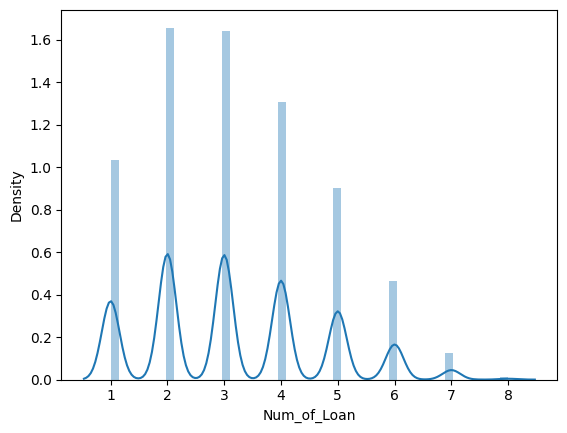

In [1585]:
sns.distplot(data.Num_of_Loan)

In [1586]:
data.shape

(91812, 33)

## Delay_from_due_date            

In [1587]:
data.Delay_from_due_date.value_counts()

Delay_from_due_date
 15    3305
 13    3166
 8     3069
 14    3024
 10    3021
       ... 
-4       57
 65      52
 66      30
-5       29
 67      17
Name: count, Length: 73, dtype: int64

In [1588]:
data.Delay_from_due_date.unique()

array([ 3, -1,  5,  6,  8,  7, 13, 10,  0,  4,  9,  1, 30, 31, 34, 27, 14,
       11,  2, -2, 16, 17, 15, 23, 22, 21, 12, 18, 19, 52, 51, 48, 53, 43,
       28, 25, 20, 47, 46, 49, 24, 61, 26, 29, 58, 45, 59, 55, 56, 57, 54,
       62, 65, 64, 67, 50, 36, 41, 33, 32, 39, 44, 42, 60, 35, 38, -3, 63,
       40, 37, -5, -4, 66], dtype=int64)

In [1589]:
data.Delay_from_due_date.isnull().sum()

0

In [1590]:
data.Delay_from_due_date = data.Delay_from_due_date.apply(lambda x:0 if x < 0 else x)

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\2507336795.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Delay_from_due_date)


<Axes: xlabel='Delay_from_due_date', ylabel='Density'>

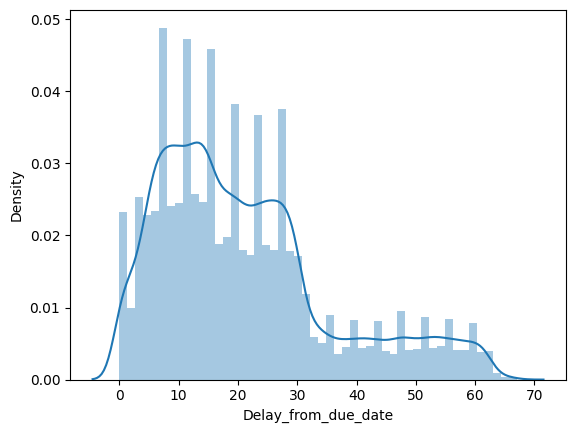

In [1591]:
sns.distplot(data.Delay_from_due_date)

In [1592]:
data.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                   0
Delay_from_due_date            0
Num_of_Delayed_Payment      6459
Changed_Credit_Limit           0
Num_Credit_Inquiries        1785
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Credit_History_Age          8348
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     4103
Payment_Behaviour              0
Monthly_Balance             1117
Credit_Score                   0
Auto Loan                      0
Credit-Builder Loan            0
Personal Loan                  0
Home Equity Loan               0
Not Specified                  0
Mortgage Loan                  0
Student Lo

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\2958027259.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.log1p(data.Delay_from_due_date))


<Axes: xlabel='Delay_from_due_date', ylabel='Density'>

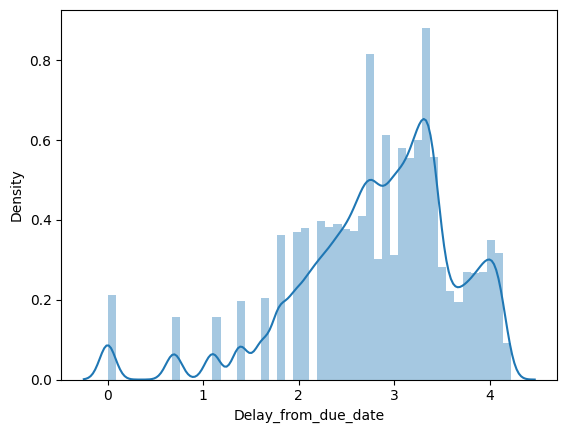

In [1593]:
sns.distplot(np.log1p(data.Delay_from_due_date))

## Num_of_Delayed_Payment

In [1594]:
Deleyed_Payment = data.copy()

In [1595]:
data = Deleyed_Payment.copy()

In [1596]:
data.Num_of_Delayed_Payment.info()

<class 'pandas.core.series.Series'>
Index: 91812 entries, 0 to 99999
Series name: Num_of_Delayed_Payment
Non-Null Count  Dtype 
--------------  ----- 
85353 non-null  object
dtypes: object(1)
memory usage: 3.4+ MB


In [1597]:
data['Num_of_Delayed_Payment'] = data['Num_of_Delayed_Payment'].str.replace('_','')

In [1598]:
data.Num_of_Delayed_Payment.value_counts()

Num_of_Delayed_Payment
19      5017
17      4988
10      4876
16      4829
15      4812
        ... 
1502       1
4075       1
2697       1
3845       1
2047       1
Name: count, Length: 648, dtype: int64

In [1599]:
data['Num_of_Delayed_Payment'].isnull().sum()

6459

In [1600]:
def fun1(x):
    if x is not np.nan:
        if '-' in x:
            return int(0)
        else:
            return int(x)

In [1601]:
data.Num_of_Delayed_Payment = data.Num_of_Delayed_Payment.apply(fun1)

In [1602]:
#data.Num_of_Delayed_Payment.unique()

In [1603]:
data.Num_of_Delayed_Payment.value_counts()

Num_of_Delayed_Payment
19.0      5017
17.0      4988
10.0      4876
16.0      4829
15.0      4812
          ... 
640.0        1
2573.0       1
1060.0       1
3845.0       1
2047.0       1
Name: count, Length: 645, dtype: int64

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\1718487052.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Num_of_Delayed_Payment)


<Axes: xlabel='Num_of_Delayed_Payment', ylabel='Density'>

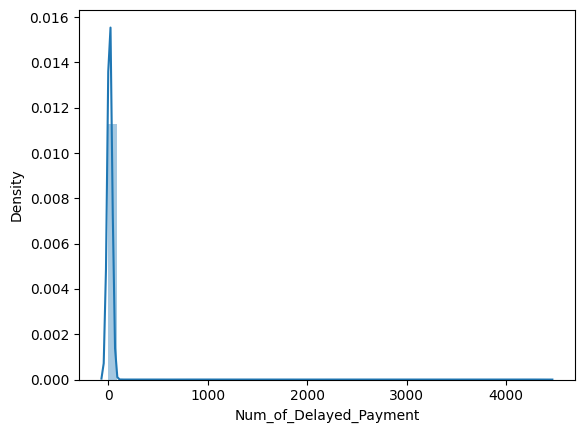

In [1604]:
sns.distplot(data.Num_of_Delayed_Payment)

In [1605]:
#data[data.Num_of_Delayed_Payment > 31]

In [1606]:
data.Num_of_Delayed_Payment.isnull().sum()

6459

In [1607]:
data[data.Num_of_Delayed_Payment > 30]

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,...,Credit_Score,Auto Loan,Credit-Builder Loan,Personal Loan,Home Equity Loan,Not Specified,Mortgage Loan,Student Loan,Debt Consolidation Loan,Payday Loan
252,May,43,Musician,18627.640,9.185139,7.0,7,19,4,"Payday Loan, Not Specified, Student Loan, Cred...",...,0.0,0,1,0,0,1,0,1,0,1
284,May,36,Manager,71681.400,8.665691,3.0,6,15,1,Not Specified,...,2.0,0,0,0,0,1,0,0,0,0
304,January,36,Musician,15566.020,7.261343,8.0,5,32,4,"Home Equity Loan, Credit-Builder Loan, Persona...",...,0.0,0,1,1,1,0,1,0,0,0
409,February,14,Developer,39887.220,8.078978,9.0,9,16,5,"Not Specified, Student Loan, Auto Loan, Home E...",...,0.0,1,0,0,1,1,1,1,0,0
643,April,47,Accountant,17787.340,7.125507,8.0,4,16,2,"Student Loan, Auto Loan",...,1.0,1,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99133,June,31,Lawyer,77633.040,8.800328,7.0,5,34,3,"Payday Loan, Credit-Builder Loan, Student Loan...",...,0.0,0,1,0,0,0,0,1,0,1
99402,March,27,Mechanic,8968.555,6.781488,10.0,8,30,6,"Credit-Builder Loan, Auto Loan, Mortgage Loan,...",...,0.0,1,1,1,0,1,1,0,1,0
99562,March,28,Lawyer,21471.580,7.539186,7.0,3,16,2,"Credit-Builder Loan, Student Loan",...,1.0,0,1,0,0,0,0,1,0,0
99563,April,28,Lawyer,21471.580,7.539186,7.0,3,16,2,"Credit-Builder Loan, Student Loan",...,1.0,0,1,0,0,0,0,1,0,0


In [1608]:
Q1 = data['Num_of_Delayed_Payment'].quantile(0.25)
Q3 = data['Num_of_Delayed_Payment'].quantile(0.75)
IQR = Q3 - Q1
#print(Q1,Q3)
# Define lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print(lower_bound,upper_bound)
# Identify and remove outliers
data = data[((data['Num_of_Delayed_Payment'] >= 0) & ((data['Num_of_Delayed_Payment'] <= upper_bound)) | pd.isna(data['Num_of_Delayed_Payment']))]

-4.5 31.5


C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\1718487052.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Num_of_Delayed_Payment)


<Axes: xlabel='Num_of_Delayed_Payment', ylabel='Density'>

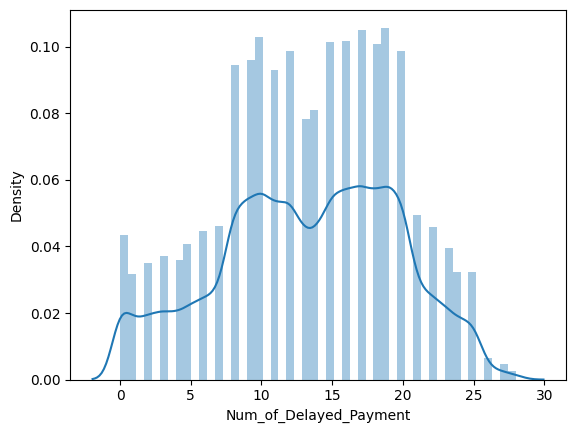

In [1609]:
sns.distplot(data.Num_of_Delayed_Payment)

In [1610]:
data.Num_of_Delayed_Payment.isnull().sum()

6459

In [1618]:
random_num_of_delayed_payment = np.random.randint(data.Num_of_Delayed_Payment.mean()-data.Num_of_Delayed_Payment.std()*1.5,data.Num_of_Delayed_Payment.mean()+data.Num_of_Delayed_Payment.std()*1.5,6459)

In [1619]:
random_num_of_delayed_payment[:10]

array([14, 14, 17,  6,  6,  4,  4, 11, 21, 17])

In [1620]:
data['Num_of_Delayed_Payment'][data.Num_of_Delayed_Payment.isnull()]= random_num_of_delayed_payment

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\3477885297.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Num_of_Delayed_Payment'][data.Num_of_Delayed_Payment.isnull()]= random_num_of_delayed_payment


In [1621]:
data.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                   0
Delay_from_due_date            0
Num_of_Delayed_Payment         0
Changed_Credit_Limit           0
Num_Credit_Inquiries        1775
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Credit_History_Age          8283
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     4072
Payment_Behaviour              0
Monthly_Balance             1111
Credit_Score                   0
Auto Loan                      0
Credit-Builder Loan            0
Personal Loan                  0
Home Equity Loan               0
Not Specified                  0
Mortgage Loan                  0
Student Lo

## Changed_Credit_Limit

In [1622]:
changed_limit = data.copy()

In [1623]:
data = changed_limit.copy()

In [1624]:
data.Changed_Credit_Limit.info()

<class 'pandas.core.series.Series'>
Index: 91145 entries, 0 to 99999
Series name: Changed_Credit_Limit
Non-Null Count  Dtype 
--------------  ----- 
91145 non-null  object
dtypes: object(1)
memory usage: 1.4+ MB


In [1625]:
data.Changed_Credit_Limit.value_counts()

Changed_Credit_Limit
_                     1911
8.22                   122
11.5                   120
11.32                  118
10.06                  110
                      ... 
35.69                    1
36.49                    1
34.489999999999995       1
30.49                    1
-6.2                     1
Name: count, Length: 4336, dtype: int64

In [1626]:
data.Changed_Credit_Limit.unique()

array(['11.27', '6.27', '9.27', ..., '27.38', '17.509999999999998',
       '25.16'], dtype=object)

In [1627]:
#data[(data.Changed_Credit_Limit >= 0) & (data.Changed_Credit_Limit <= 0.99)]['Changed_Credit_Limit']

In [1628]:
data.Changed_Credit_Limit = data.Changed_Credit_Limit.str.replace('_','99999').astype(float)

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\2104142020.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data[data.Changed_Credit_Limit < 99999]['Changed_Credit_Limit'])


<Axes: xlabel='Changed_Credit_Limit', ylabel='Density'>

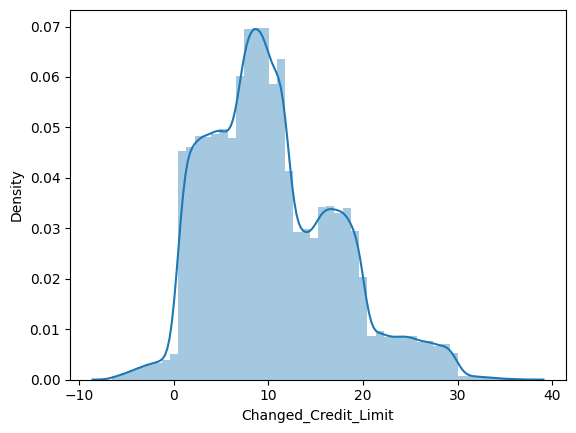

In [1629]:
sns.distplot(data[data.Changed_Credit_Limit < 99999]['Changed_Credit_Limit'])

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\2816519167.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Changed_Credit_Limit.replace(0,data.Changed_Credit_Limit.mean()))


<Axes: xlabel='Changed_Credit_Limit', ylabel='Density'>

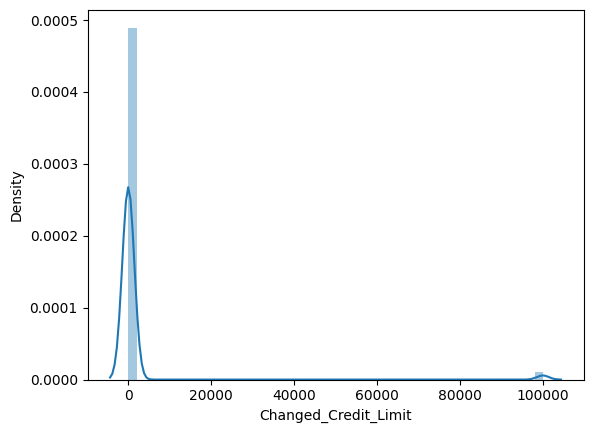

In [1630]:
sns.distplot(data.Changed_Credit_Limit.replace(0,data.Changed_Credit_Limit.mean()))

In [1631]:
data.columns

Index(['Month', 'Age', 'Occupation', 'Annual_Income', 'Monthly_Inhand_Salary',
       'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Type_of_Loan', 'Delay_from_due_date', 'Num_of_Delayed_Payment',
       'Changed_Credit_Limit', 'Num_Credit_Inquiries', 'Credit_Mix',
       'Outstanding_Debt', 'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score', 'Auto Loan', 'Credit-Builder Loan', 'Personal Loan',
       'Home Equity Loan', 'Not Specified', 'Mortgage Loan', 'Student Loan',
       'Debt Consolidation Loan', 'Payday Loan'],
      dtype='object')

In [1632]:
data[data.Changed_Credit_Limit < 99999]['Changed_Credit_Limit'].min()

-6.48

In [1637]:
data[data.Changed_Credit_Limit == 99999]

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Type_of_Loan,...,Credit_Score,Auto Loan,Credit-Builder Loan,Personal Loan,Home Equity Loan,Not Specified,Mortgage Loan,Student Loan,Debt Consolidation Loan,Payday Loan
65,February,23,Doctor,114838.410,9.194706,2.0,5,7,3,"Personal Loan, Debt Consolidation Loan, Auto Loan",...,2.0,1,0,1,0,0,0,0,1,0
66,March,23,Doctor,114838.410,7.397469,2.0,5,7,3,"Personal Loan, Debt Consolidation Loan, Auto Loan",...,2.0,1,0,1,0,0,0,0,1,0
109,June,39,Manager,8701.545,6.254076,6.0,5,32,5,"Personal Loan, Payday Loan, Student Loan, Auto...",...,0.0,1,0,1,1,0,0,1,0,1
110,July,39,Manager,8701.545,9.141192,6.0,5,32,5,"Personal Loan, Payday Loan, Student Loan, Auto...",...,0.0,1,0,1,1,0,0,1,0,1
177,February,20,Entrepreneur,106733.130,9.090929,4.0,4,1,3,"Credit-Builder Loan, Mortgage Loan, Mortgage L...",...,2.0,0,1,0,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99509,June,17,Accountant,72572.460,8.737887,4.0,4,7,3,"Personal Loan, Student Loan, Student Loan, Hom...",...,1.0,0,0,1,1,0,0,1,0,0
99548,May,28,Writer,29090.500,7.813272,5.0,7,20,4,"Not Specified, Mortgage Loan, Personal Loan, D...",...,0.0,0,0,1,0,1,1,0,1,0
99800,January,16,Developer,14937.490,8.574700,8.0,8,22,4,"Student Loan, Mortgage Loan, Debt Consolidatio...",...,1.0,0,0,0,1,0,1,1,1,0
99892,May,38,other,85744.120,6.992045,6.0,7,11,2,"Auto Loan, Debt Consolidation Loan",...,1.0,1,0,0,0,0,0,0,1,0


In [1638]:
random_Changed_Credit_Limit = np.random.uniform(data[data.Changed_Credit_Limit < 99999]['Changed_Credit_Limit'].min(),data[data.Changed_Credit_Limit < 99999]['Changed_Credit_Limit'].max(),1911)

In [1639]:
min(random_Changed_Credit_Limit)

-6.445749766492169

In [1640]:
data['Changed_Credit_Limit'][data.Changed_Credit_Limit == 99999] = random_Changed_Credit_Limit

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\3008252143.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Changed_Credit_Limit'][data.Changed_Credit_Limit == 99999] = random_Changed_Credit_Limit


C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\113201663.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Changed_Credit_Limit)


<Axes: xlabel='Changed_Credit_Limit', ylabel='Density'>

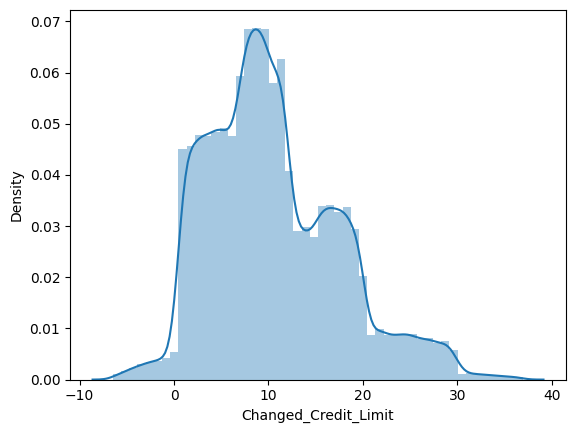

In [1641]:
sns.distplot(data.Changed_Credit_Limit)

In [1642]:
data.shape

(91145, 33)

In [1643]:
data.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                   0
Delay_from_due_date            0
Num_of_Delayed_Payment         0
Changed_Credit_Limit           0
Num_Credit_Inquiries        1775
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Credit_History_Age          8283
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     4072
Payment_Behaviour              0
Monthly_Balance             1111
Credit_Score                   0
Auto Loan                      0
Credit-Builder Loan            0
Personal Loan                  0
Home Equity Loan               0
Not Specified                  0
Mortgage Loan                  0
Student Lo

## Num_Credit_Inquiries        

In [1644]:
num_credit_inq = data.copy()

In [1645]:
data = num_credit_inq.copy()

In [1646]:
data.Num_Credit_Inquiries.value_counts()

Num_Credit_Inquiries
4.0       10297
3.0        8100
6.0        7400
7.0        7357
2.0        7345
          ...  
233.0         1
566.0         1
2231.0        1
2548.0        1
74.0          1
Name: count, Length: 1159, dtype: int64

In [1647]:
data.Num_Credit_Inquiries.isnull().sum()

1775

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\527838206.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Num_Credit_Inquiries)


<Axes: xlabel='Num_Credit_Inquiries', ylabel='Density'>

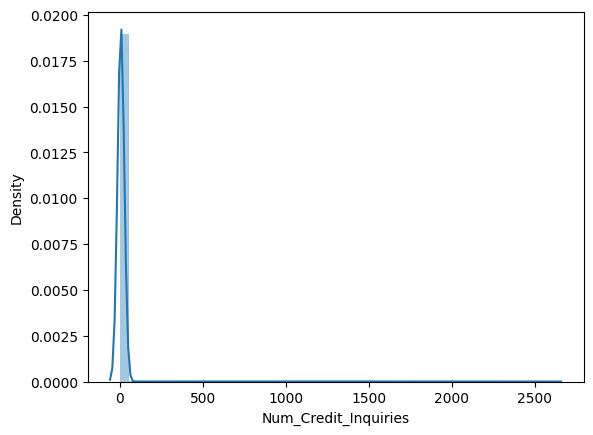

In [1648]:
sns.distplot(data.Num_Credit_Inquiries)

In [1649]:
data[data.Num_Credit_Inquiries > 18]['Num_Credit_Inquiries']

173      1050.0
193      1044.0
198      1936.0
234       568.0
312      1618.0
          ...  
99513    2448.0
99717    1361.0
99789      93.0
99800    2209.0
99872      74.0
Name: Num_Credit_Inquiries, Length: 1526, dtype: float64

In [1650]:
Q1 = data['Num_Credit_Inquiries'].quantile(0.25)
Q3 = data['Num_Credit_Inquiries'].quantile(0.75)
IQR = Q3 - Q1
#print(Q1,Q3)
# Define lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR
print(lower_bound,upper_bound)
# Identify and remove outliers
data = data[((data['Num_Credit_Inquiries'] >= 0) & ((data['Num_Credit_Inquiries'] <= upper_bound)) | pd.isna(data['Num_Credit_Inquiries']))]

-6.0 18.0


In [1651]:
data.Num_Credit_Inquiries.isnull().sum()

1775

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\527838206.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Num_Credit_Inquiries)


<Axes: xlabel='Num_Credit_Inquiries', ylabel='Density'>

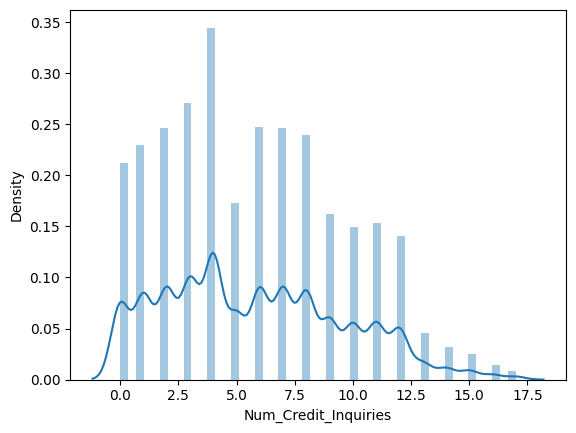

In [1652]:
sns.distplot(data.Num_Credit_Inquiries)

In [1653]:
data.Num_Credit_Inquiries.min()

0.0

In [1654]:
random_num_of_credit_inquires = np.random.randint(data.Num_Credit_Inquiries.min(),data.Num_Credit_Inquiries.max(),1775)
data['Num_Credit_Inquiries'][data.Num_Credit_Inquiries.isnull()]= random_num_of_credit_inquires

In [1655]:
data.Num_Credit_Inquiries.isnull().sum()

0

In [1656]:
data.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                   0
Delay_from_due_date            0
Num_of_Delayed_Payment         0
Changed_Credit_Limit           0
Num_Credit_Inquiries           0
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Credit_History_Age          8128
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     3989
Payment_Behaviour              0
Monthly_Balance             1091
Credit_Score                   0
Auto Loan                      0
Credit-Builder Loan            0
Personal Loan                  0
Home Equity Loan               0
Not Specified                  0
Mortgage Loan                  0
Student Lo

## Credit_Mix 

In [1657]:
credit_data = data.copy()

In [1658]:
data.Credit_Mix.value_counts()

Credit_Mix
Standard    32696
Good        21741
_           18105
Bad         17077
Name: count, dtype: int64

In [1659]:
data.Credit_Mix.mode()[0]

'Standard'

In [1660]:
data.Credit_Mix.replace('_',data.Credit_Mix.mode()[0],inplace=True)

## Outstanding_Debt

In [1661]:
outstanding_dept = data.copy()

In [1662]:
data.Outstanding_Debt.unique()

array(['809.98', '605.03', '1303.01', ..., '3571.7_', '3571.7', '502.38'],
      dtype=object)

In [1663]:
data.Outstanding_Debt.value_counts()

Outstanding_Debt
1109.03     22
1360.45     19
460.46      19
1151.7      17
1292.14     16
            ..
544.82_      1
263.49_      1
2918.16_     1
645.77_      1
159.41_      1
Name: count, Length: 13077, dtype: int64

In [1664]:
data.Outstanding_Debt = data.Outstanding_Debt.str.replace('_','').astype(float)

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\3767798530.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Outstanding_Debt)


<Axes: xlabel='Outstanding_Debt', ylabel='Density'>

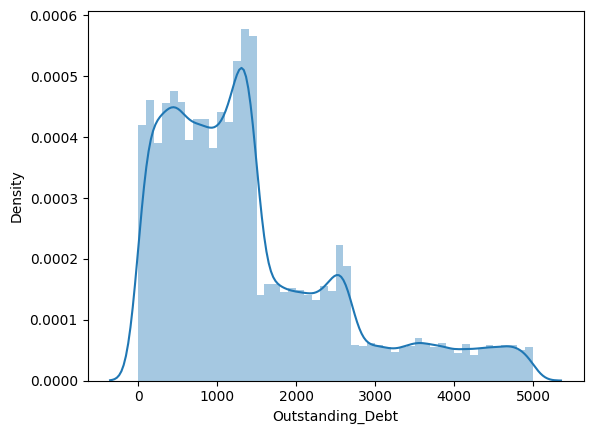

In [1665]:
sns.distplot(data.Outstanding_Debt)

In [1666]:
data.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                   0
Delay_from_due_date            0
Num_of_Delayed_Payment         0
Changed_Credit_Limit           0
Num_Credit_Inquiries           0
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Credit_History_Age          8128
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     3989
Payment_Behaviour              0
Monthly_Balance             1091
Credit_Score                   0
Auto Loan                      0
Credit-Builder Loan            0
Personal Loan                  0
Home Equity Loan               0
Not Specified                  0
Mortgage Loan                  0
Student Lo

## Credit_Utilization_Ratio       

In [1667]:
credit_ur = data.copy()

In [1668]:
data.Credit_Utilization_Ratio.value_counts()

Credit_Utilization_Ratio
26.822620    1
23.181517    1
26.128684    1
27.260141    1
36.699130    1
            ..
38.009541    1
29.520555    1
28.957526    1
26.650627    1
34.192463    1
Name: count, Length: 89619, dtype: int64

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\3356372389.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Credit_Utilization_Ratio)


<Axes: xlabel='Credit_Utilization_Ratio', ylabel='Density'>

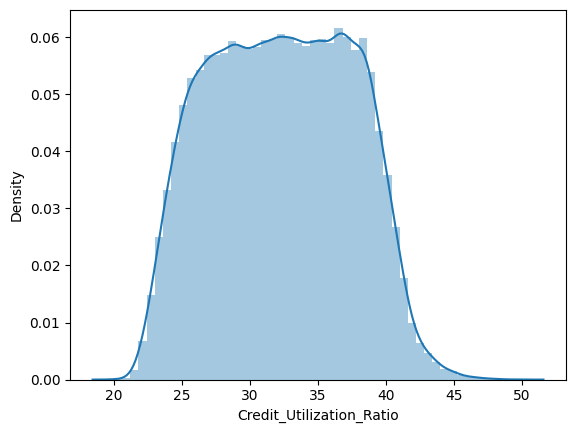

In [1669]:
sns.distplot(data.Credit_Utilization_Ratio)

## Credit_History_Age          

In [1670]:
data.Credit_History_Age.isnull().sum()

8128

In [1671]:
data.Credit_History_Age.value_counts()

Credit_History_Age
15 Years and 9 Months     404
17 Years and 9 Months     400
17 Years and 11 Months    395
15 Years and 11 Months    394
18 Years and 4 Months     391
                         ... 
0 Years and 3 Months       19
33 Years and 7 Months      12
33 Years and 8 Months      12
0 Years and 2 Months       12
0 Years and 1 Months        1
Name: count, Length: 404, dtype: int64

In [1672]:
contingency_table = pd.crosstab(data['Credit_History_Age'], data['Credit_Score'])

chi2, p, _, _ = chi2_contingency(contingency_table)

print("Chi-squared statistic:", chi2)
print("P-value:", p)

Chi-squared statistic: 15286.084536348562
P-value: 0.0


In [1673]:
data.Credit_History_Age.str.split()

0         [22, Years, and, 1, Months]
1                                 NaN
3         [22, Years, and, 4, Months]
4         [22, Years, and, 5, Months]
5         [22, Years, and, 6, Months]
                     ...             
99994     [31, Years, and, 5, Months]
99995     [31, Years, and, 6, Months]
99996     [31, Years, and, 7, Months]
99998     [31, Years, and, 9, Months]
99999    [31, Years, and, 10, Months]
Name: Credit_History_Age, Length: 89619, dtype: object

In [1699]:
def months(x):
    if pd.notna(x):  # Check for NaN values using pd.notna()
        parts = x.split()  # Split the string by whitespace
        if len(parts) >= 4:  # Ensure there are at least 4 parts (year, month, etc.)
            year = float(parts[0])
            month = float(parts[3])
            return (year * 12) + month

In [1701]:
data.Credit_History_Age = data.Credit_History_Age.apply(months)

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\179068712.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Credit_History_Age)


<Axes: xlabel='Credit_History_Age', ylabel='Density'>

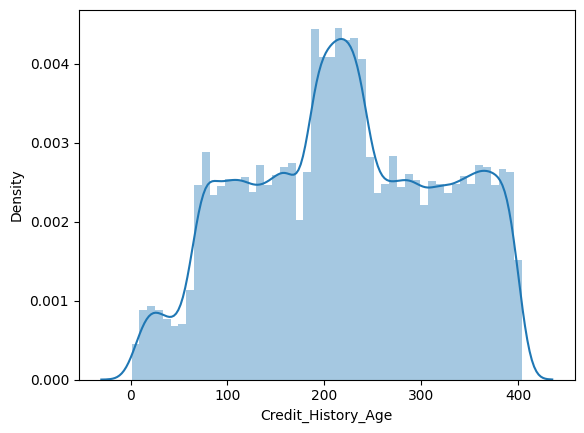

In [1703]:
sns.distplot(data.Credit_History_Age)

In [1705]:
data.Credit_History_Age.isnull().sum()

8128

In [1706]:
random_num_year = np.random.randint(data.Credit_History_Age.mean()-data.Credit_History_Age.std()*1.5,data.Credit_History_Age.mean()+data.Credit_History_Age.std()*1.5,8128)
data['Credit_History_Age'][data.Credit_History_Age.isnull()]= random_num_year

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\704172059.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Credit_History_Age'][data.Credit_History_Age.isnull()]= random_num_year


In [1707]:
#random_num_month = np.random.randint(data.month.min(),data.month.max(),8088)
#data['month'][data.month.isnull()]= random_num_month

In [1708]:
data.drop('Credit_History_Age',axis=1,inplace=True)

In [1709]:
data.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                   0
Delay_from_due_date            0
Num_of_Delayed_Payment         0
Changed_Credit_Limit           0
Num_Credit_Inquiries           0
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly     3989
Payment_Behaviour              0
Monthly_Balance             1091
Credit_Score                   0
Auto Loan                      0
Credit-Builder Loan            0
Personal Loan                  0
Home Equity Loan               0
Not Specified                  0
Mortgage Loan                  0
Student Loan                   0
Debt Conso

## Payment_of_Min_Amount          

In [1710]:
payment_min_amount = data.copy()

In [1711]:
data.Payment_of_Min_Amount.value_counts()

Payment_of_Min_Amount
Yes    46956
No     31912
NM     10751
Name: count, dtype: int64

<Axes: xlabel='Payment_of_Min_Amount', ylabel='count'>

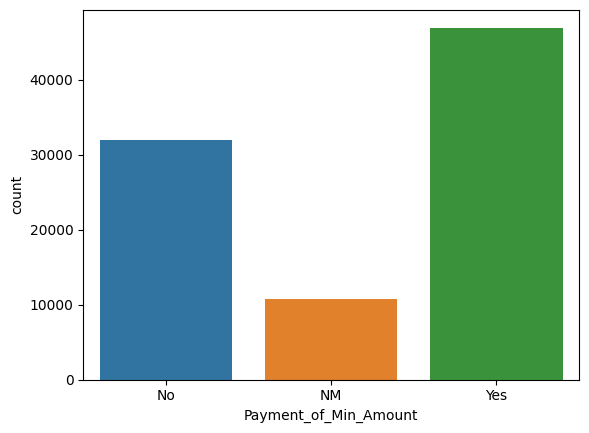

In [1712]:
sns.countplot(x = data.Payment_of_Min_Amount)

## Total_EMI_per_month            

In [1713]:
data.Total_EMI_per_month.value_counts()

Total_EMI_per_month
0.000000        9467
75.602221          8
168.521147         8
46.471197          8
43.980068          8
                ... 
45644.000000       1
15563.000000       1
19997.000000       1
41437.000000       1
58638.000000       1
Name: count, Length: 14625, dtype: int64

In [1714]:
data.Total_EMI_per_month.unique()

array([4.95749492e+01, 1.88162146e+01, 2.46992319e+02, ...,
       1.21120000e+04, 3.51040226e+01, 5.86380000e+04])

In [1715]:
data.Total_EMI_per_month.isnull().sum()

0

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\4268780986.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Total_EMI_per_month)


<Axes: xlabel='Total_EMI_per_month', ylabel='Density'>

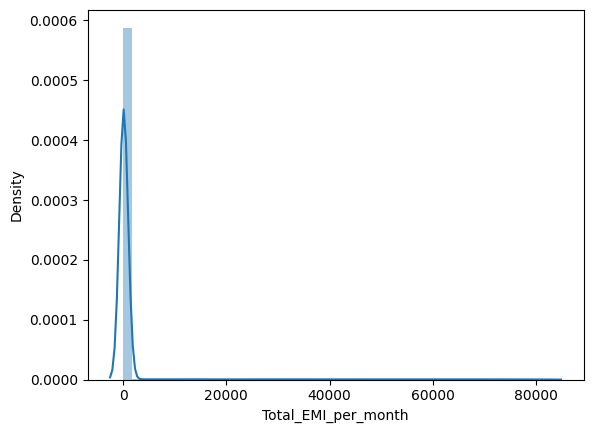

In [1716]:
sns.distplot(data.Total_EMI_per_month)

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\2645825680.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.log1p(data.Total_EMI_per_month))


<Axes: xlabel='Total_EMI_per_month', ylabel='Density'>

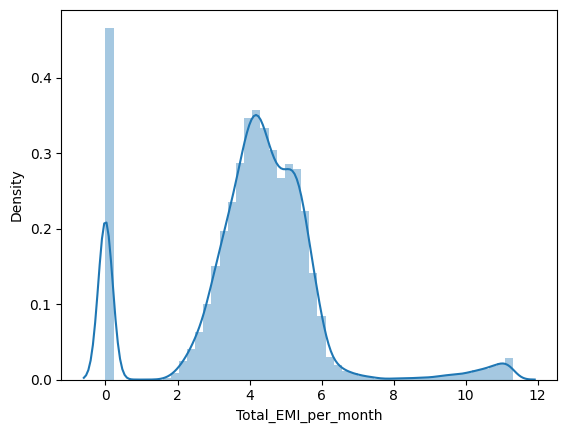

In [1717]:
sns.distplot(np.log1p(data.Total_EMI_per_month))

## Apply Log on above column

## Amount_invested_monthly     

In [1718]:
data.Amount_invested_monthly = data.Amount_invested_monthly.str.replace('__','').astype(float)

In [1719]:
data.Amount_invested_monthly.value_counts()

Amount_invested_monthly
10000.000000    3844
0.000000         156
89.570291          1
224.439781         1
77.715357          1
                ... 
205.337595         1
181.078716         1
112.492826         1
328.439719         1
167.163865         1
Name: count, Length: 81632, dtype: int64

In [1720]:
data.Amount_invested_monthly = data.Amount_invested_monthly.replace(10000,np.nan)

In [1721]:
data.Amount_invested_monthly.min(),data.Amount_invested_monthly.max()

(0.0, 1977.326102249349)

In [1722]:
data.Amount_invested_monthly.isnull().sum()

7833

In [1723]:
#sns.distplot(data.Amount_invested_monthly.fillna(data.Amount_invested_monthly.median()))

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\2680398040.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.log1p(data.Amount_invested_monthly))


<Axes: xlabel='Amount_invested_monthly', ylabel='Density'>

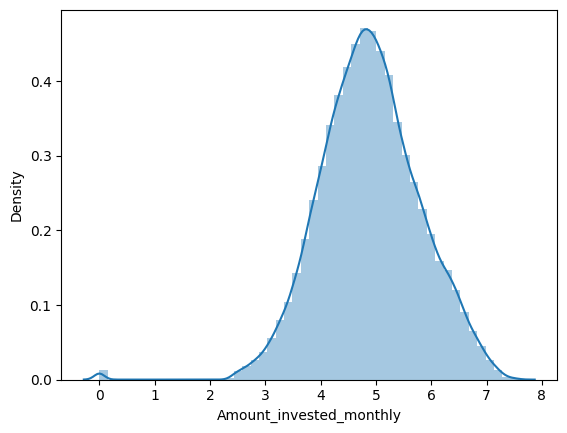

In [1724]:
sns.distplot(np.log1p(data.Amount_invested_monthly))

In [1725]:
data.Amount_invested_monthly = np.log1p(data.Amount_invested_monthly)

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\2704242956.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Amount_invested_monthly)


<Axes: xlabel='Amount_invested_monthly', ylabel='Density'>

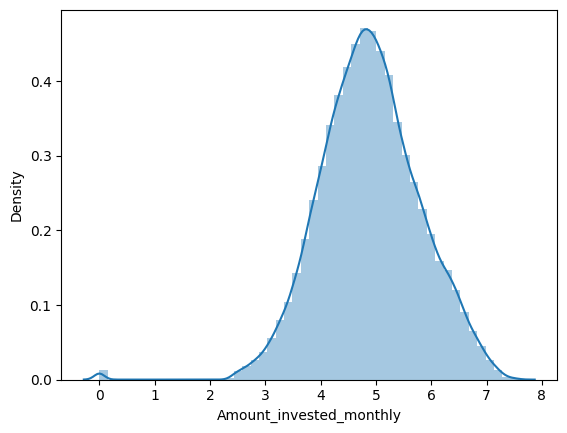

In [1726]:
sns.distplot(data.Amount_invested_monthly)

In [1727]:
data.Amount_invested_monthly.isnull().sum()

7833

In [1728]:
data.Amount_invested_monthly.max()

7.5900063632296435

In [1731]:
random_amount_invested = np.random.uniform(data.Amount_invested_monthly.mean()-data.Amount_invested_monthly.std()*2,data.Amount_invested_monthly.mean()+data.Amount_invested_monthly.std()*2,7833)
data['Amount_invested_monthly'][data.Amount_invested_monthly.isnull()]= random_amount_invested

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\1878127093.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Amount_invested_monthly'][data.Amount_invested_monthly.isnull()]= random_amount_invested


In [1732]:
#Continue....

In [1733]:
data.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                   0
Delay_from_due_date            0
Num_of_Delayed_Payment         0
Changed_Credit_Limit           0
Num_Credit_Inquiries           0
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly        0
Payment_Behaviour              0
Monthly_Balance             1091
Credit_Score                   0
Auto Loan                      0
Credit-Builder Loan            0
Personal Loan                  0
Home Equity Loan               0
Not Specified                  0
Mortgage Loan                  0
Student Loan                   0
Debt Conso

## Payment_Behaviour

In [1734]:
payment_b = data.copy() 

In [1735]:
data.Payment_Behaviour.value_counts()

Payment_Behaviour
Low_spent_Small_value_payments      22820
High_spent_Medium_value_payments    15719
Low_spent_Medium_value_payments     12419
High_spent_Large_value_payments     12329
High_spent_Small_value_payments     10200
Low_spent_Large_value_payments       9330
!@9#%8                               6802
Name: count, dtype: int64

In [1736]:
data.Payment_Behaviour.replace('!@9#%8',np.nan,inplace=True)

In [1737]:
data.Payment_Behaviour.fillna(method='ffill',inplace=True)
data.Payment_Behaviour.fillna(method='bfill',inplace=True)

In [1738]:
data.isnull().sum()

Month                          0
Age                            0
Occupation                     0
Annual_Income                  0
Monthly_Inhand_Salary          0
Num_Bank_Accounts              0
Num_Credit_Card                0
Interest_Rate                  0
Num_of_Loan                    0
Type_of_Loan                   0
Delay_from_due_date            0
Num_of_Delayed_Payment         0
Changed_Credit_Limit           0
Num_Credit_Inquiries           0
Credit_Mix                     0
Outstanding_Debt               0
Credit_Utilization_Ratio       0
Payment_of_Min_Amount          0
Total_EMI_per_month            0
Amount_invested_monthly        0
Payment_Behaviour              0
Monthly_Balance             1091
Credit_Score                   0
Auto Loan                      0
Credit-Builder Loan            0
Personal Loan                  0
Home Equity Loan               0
Not Specified                  0
Mortgage Loan                  0
Student Loan                   0
Debt Conso

## Monthly_Balance             

In [1739]:
M_B = data.copy()

In [1740]:
data = M_B.copy()

In [1741]:
data.Monthly_Balance.value_counts()

Monthly_Balance
__-333333333333333333333333333__    9
312.49408867943663                  1
499.07883922313073                  1
327.67043574330984                  1
399.0452874510198                   1
                                   ..
280.21096067244525                  1
181.1826516852624                   1
295.6552313534578                   1
329.62472809966727                  1
393.6736955618808                   1
Name: count, Length: 88520, dtype: int64

In [1742]:
data.Monthly_Balance.isnull().sum()

1091

In [1743]:
data.Monthly_Balance = data.Monthly_Balance.replace('__-333333333333333333333333333__',np.nan).astype(float)

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\1974732244.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(data.Monthly_Balance)


<Axes: xlabel='Monthly_Balance', ylabel='Density'>

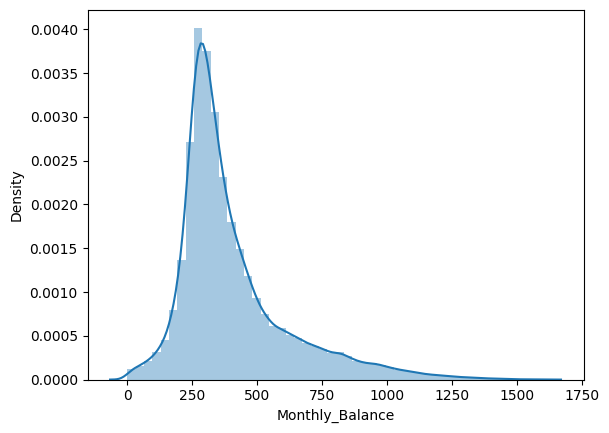

In [1744]:
sns.distplot(data.Monthly_Balance)

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\3661772050.py:1: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(np.log1p(data.Monthly_Balance))


<Axes: xlabel='Monthly_Balance', ylabel='Density'>

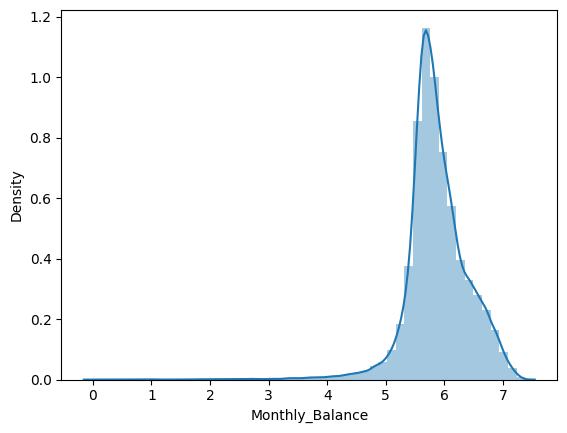

In [1745]:
sns.distplot(np.log1p(data.Monthly_Balance))

In [1746]:
data.Monthly_Balance = np.log1p(data.Monthly_Balance)

In [1747]:
data.Monthly_Balance.isnull().sum()

1100

In [1749]:
random_mb = np.random.uniform(data.Monthly_Balance.mean()-data.Monthly_Balance.std()*3,data.Monthly_Balance.mean()+data.Monthly_Balance.std()*3,1100)
data['Monthly_Balance'][data.Monthly_Balance.isnull()]= random_mb

C:\Users\DARSHIT\AppData\Local\Temp\ipykernel_2068\2364486751.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['Monthly_Balance'][data.Monthly_Balance.isnull()]= random_mb


## Other Work

In [1750]:
final_data = data.copy()

In [1751]:
data.corr(numeric_only=True)['Credit_Score']

Age                         0.160106
Annual_Income               0.006993
Monthly_Inhand_Salary       0.182539
Num_Bank_Accounts          -0.370096
Num_Credit_Card            -0.403075
Interest_Rate              -0.483530
Num_of_Loan                -0.278375
Delay_from_due_date        -0.431311
Num_of_Delayed_Payment     -0.347166
Changed_Credit_Limit       -0.158754
Num_Credit_Inquiries       -0.422400
Outstanding_Debt           -0.386022
Credit_Utilization_Ratio    0.045182
Total_EMI_per_month         0.004399
Amount_invested_monthly     0.120318
Monthly_Balance             0.180302
Credit_Score                1.000000
Auto Loan                  -0.111781
Credit-Builder Loan        -0.099023
Personal Loan              -0.105563
Home Equity Loan           -0.094042
Not Specified              -0.091547
Mortgage Loan              -0.096764
Student Loan               -0.097282
Debt Consolidation Loan    -0.101526
Payday Loan                -0.098045
Name: Credit_Score, dtype: float64

In [1754]:
data.drop('Type_of_Loan',inplace=True,axis=1)

In [1755]:
data.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Credit_Score,Auto Loan,Credit-Builder Loan,Personal Loan,Home Equity Loan,Not Specified,Mortgage Loan,Student Loan,Debt Consolidation Loan,Payday Loan
0,January,23,Scientist,19114.12,7.509797,3.0,4,3,4,3,...,2.0,1,1,1,1,0,0,0,0,0
1,February,23,Scientist,19114.12,7.064796,3.0,4,3,4,0,...,2.0,1,1,1,1,0,0,0,0,0
3,April,23,Scientist,19114.12,9.011335,3.0,4,3,4,5,...,2.0,1,1,1,1,0,0,0,0,0
4,May,23,Scientist,19114.12,7.509797,3.0,4,3,4,6,...,2.0,1,1,1,1,0,0,0,0,0
5,June,23,Scientist,19114.12,8.885134,3.0,4,3,4,8,...,2.0,1,1,1,1,0,0,0,0,0


## Model 

In [1756]:
x = data.drop(['Credit_Score'],axis=1)
y = data['Credit_Score']

In [1757]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.2,random_state=5)

In [1758]:
x.columns

Index(['Month', 'Age', 'Occupation', 'Annual_Income', 'Monthly_Inhand_Salary',
       'Num_Bank_Accounts', 'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Payment_of_Min_Amount',
       'Total_EMI_per_month', 'Amount_invested_monthly', 'Payment_Behaviour',
       'Monthly_Balance', 'Auto Loan', 'Credit-Builder Loan', 'Personal Loan',
       'Home Equity Loan', 'Not Specified', 'Mortgage Loan', 'Student Loan',
       'Debt Consolidation Loan', 'Payday Loan'],
      dtype='object')

In [1759]:
x_train.head()

,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,...,Monthly_Balance,Auto Loan,Credit-Builder Loan,Personal Loan,Home Equity Loan,Not Specified,Mortgage Loan,Student Loan,Debt Consolidation Loan,Payday Loan
3472,January,29,Manager,15762.72,7.561251,3.0,3,20,3,14,...,5.768309,0,0,0,1,0,0,1,1,0
90146,March,16,Media_Manager,69803.60,7.154988,8.0,5,23,4,18,...,6.001252,0,1,0,0,1,0,1,1,0
40296,January,19,Writer,38714.36,8.078129,6.0,8,25,4,22,...,5.303908,0,1,0,0,0,0,1,1,1
2173,June,36,Engineer,17655.43,7.333863,8.0,10,34,6,65,...,5.344633,1,1,0,1,1,0,1,1,0
29674,March,31,Lawyer,50686.32,8.401302,5.0,4,19,2,30,...,6.230529,1,0,1,0,0,0,0,0,0


In [1760]:
x_train.Credit_Mix.value_counts()

Credit_Mix
Standard    40516
Good        17465
Bad         13714
Name: count, dtype: int64

In [1761]:
ct1 = ColumnTransformer([
    ('t1',OrdinalEncoder(categories=[['Bad','Standard','Good']]),['Credit_Mix']),
    ('t2',FunctionTransformer(func=np.log1p),['Annual_Income','Total_EMI_per_month','Outstanding_Debt','Delay_from_due_date']),
    ('t3',OneHotEncoder(sparse=False,drop='first',handle_unknown='ignore'),
     ['Month','Occupation','Payment_of_Min_Amount','Payment_Behaviour'])
],remainder='passthrough')

In [1762]:
ct1.fit_transform(x_train).shape

C:\Users\DARSHIT\AppData\Roaming\Python\Python311\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


(71695, 55)

In [1763]:
pipe = Pipeline([
    ('p1',ct1),
    ('scaler',StandardScaler()),
    ('model',RandomForestClassifier())
])

In [1764]:
pipe.fit(x_train,y_train)

C:\Users\DARSHIT\AppData\Roaming\Python\Python311\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


Pipeline(steps=[('p1',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('t1',
                                                  OrdinalEncoder(categories=[['Bad',
                                                                              'Standard',
                                                                              'Good']]),
                                                  ['Credit_Mix']),
                                                 ('t2',
                                                  FunctionTransformer(func=<ufunc 'log1p'>),
                                                  ['Annual_Income',
                                                   'Total_EMI_per_month',
                                                   'Outstanding_Debt',
                                                   'Delay_from_due_date']),
                                                 ('t3',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore',
                                                                sparse=False),
                                                  ['Month', 'Occupation',
                                                   'Payment_of_Min_Amount',
                                                   'Payment_Behaviour'])])),
                ('scaler', StandardScaler()),
                ('model', RandomForestClassifier())])

In [1765]:
y_pred = pipe.predict(x_test)

In [1766]:
y_pred

array([0., 1., 0., ..., 2., 1., 0.])

In [1767]:
accuracy_score(y_test,y_pred)

0.7849252399018076

In [1768]:
confusion_matrix(y_test,y_pred)

array([[4176,  974,   99],
       [1137, 7714,  679],
       [  16,  950, 2179]], dtype=int64)

In [1111]:
np.mean(cross_val_score(pipe,x_train,y_train,cv=5,scoring='accuracy'))

C:\Users\DARSHIT\AppData\Roaming\Python\Python311\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
C:\Users\DARSHIT\AppData\Roaming\Python\Python311\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
C:\Users\DARSHIT\AppData\Roaming\Python\Python311\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(
C:\Users\DARSHIT\AppData\Roaming\Python\Python311\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning:

0.7661047101539203

## Voating Classifire

In [702]:
lg = LogisticRegression()
svc = SVC()
rf = RandomForestClassifier()

In [703]:
estimators = [('lr',lg),('rf',rf),('acv',svc)]
estimators_2 = [('rf1',rf),('rf2',rf),('rf3',rf)]

In [704]:
vc = VotingClassifier(estimators=estimators_2)

## Ada Boost

In [705]:
abc_lg = AdaBoostClassifier(base_estimator=lg,) 
abc_rf = AdaBoostClassifier(base_estimator=rf,)
abc_svc = AdaBoostClassifier(base_estimator=svc)

## Bagging

In [706]:
bag = BaggingClassifier(
    estimator=RandomForestClassifier(),
    random_state=42,
)

## Gradient Boosting

In [871]:
gb =GradientBoostingClassifier(max_depth=None,max_features=None,max_leaf_nodes=None)

## Stacking

In [708]:
estimators = [
    ('rf', LogisticRegression()),
    ('knn', KNeighborsClassifier(n_neighbors=5)),
    ('svc',SVC())
]

In [709]:
stacking = StackingClassifier(
    estimators=estimators, 
    final_estimator=RandomForestClassifier(),
)

## XGBoost

In [710]:
xgb = XGBClassifier()

## Deep Learning

In [830]:
y_train = y_train.astype(int)
y_test = y_test.astype(int)

In [831]:
y_train.value_counts()

Credit_Score
1    38033
0    20682
2    12646
Name: count, dtype: int64

In [832]:
x_train = ct1.fit_transform(x_train)
x_test = ct1.transform(x_test)

C:\Users\DARSHIT\AppData\Roaming\Python\Python311\site-packages\sklearn\preprocessing\_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [833]:
x_test

array([[ 0.        ,  9.04789732,  3.57517002, ...,  4.3143472 ,
         5.49825322, 15.        ],
       [ 2.        , 10.49549613,  4.02155832, ...,  5.01047322,
         5.84092433, 23.        ],
       [ 1.        ,  9.24648038,  3.66110362, ...,  4.36914209,
         5.57864111,  5.        ],
       ...,
       [ 0.        ,  9.87480409,  4.28103961, ...,  4.21708561,
         5.5004898 ,  6.        ],
       [ 1.        , 12.01007479,  4.71184757, ...,  6.01900951,
         7.01029954, 24.        ],
       [ 1.        , 11.33375956,  0.        , ...,  4.70729204,
         6.74838334, 19.        ]])

In [834]:
sc = StandardScaler()
x_train = sc.fit_transform(x_train)
x_test = sc.transform(x_test)

In [835]:
x_train.shape

(71361, 40)

In [836]:
model = Sequential()
model.add(Dense(512,input_dim = 40,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(256,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(128,activation='relu'))
model.add(Dropout(0.2))
model.add(Dense(3,activation='softmax'))

In [837]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_16 (Dense)            (None, 512)               20992     
                                                                 
 dropout_12 (Dropout)        (None, 512)               0         
                                                                 
 dense_17 (Dense)            (None, 256)               131328    
                                                                 
 dropout_13 (Dropout)        (None, 256)               0         
                                                                 
 dense_18 (Dense)            (None, 128)               32896     
                                                                 
 dropout_14 (Dropout)        (None, 128)               0         
                                                                 
 dense_19 (Dense)            (None, 3)                

In [840]:
model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [841]:
history = model.fit(x_train,y_train,epochs=10,validation_data=(x_test,y_test))

Epoch 1/10
2231/2231 [==============================] - 18s 6ms/step - loss: 0.7475 - accuracy: 0.6635 - val_loss: 0.7094 - val_accuracy: 0.6840
Epoch 2/10
2231/2231 [==============================] - 13s 6ms/step - loss: 0.7123 - accuracy: 0.6823 - val_loss: 0.7030 - val_accuracy: 0.6880
Epoch 3/10
2231/2231 [==============================] - 14s 6ms/step - loss: 0.6996 - accuracy: 0.6897 - val_loss: 0.6930 - val_accuracy: 0.6896
Epoch 4/10
2231/2231 [==============================] - 17s 7ms/step - loss: 0.6914 - accuracy: 0.6935 - val_loss: 0.6920 - val_accuracy: 0.6947
Epoch 5/10
2231/2231 [==============================] - 15s 7ms/step - loss: 0.6849 - accuracy: 0.6961 - val_loss: 0.6967 - val_accuracy: 0.6939
Epoch 6/10
2231/2231 [==============================] - 14s 6ms/step - loss: 0.6783 - accuracy: 0.7012 - val_loss: 0.6930 - val_accuracy: 0.6948
Epoch 7/10
2231/2231 [==============================] - 14s 6ms/step - loss: 0.6721 - accuracy: 0.7016 - val_loss: 0.6833 - val_ac